**PROJECT TEAM ID**: PTID-CDS-APR-25-2603  
**PROJECT CODE**   : PRCP-1000-Portugesbank  
**PROJECT NAME**   : Portugesbank

# Business Case

**Task 1:-Prepare a complete data analysis report on the given data.**

**Task 2:-Create a predictive model which will help the bank marketing team to know which customer will buy the product.**

**Task3:-Suggestions to the Bank market team to make customers buy the product.**





In [1]:
## Importing libraries 

import zipfile
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import scipy.stats as stats

In [2]:
zip_path = r'C:\Users\channaveer\Downloads\PRCP-1000-ProtugeseBank.zip'
csv_inside_zip = r'Data/bank-additional/bank-additional-full.csv'

with zipfile.ZipFile(zip_path) as z:
    with z.open(csv_inside_zip) as f:
        data = pd.read_csv(f, sep=';')  

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
data.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


## Basic Checks

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
data.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [7]:
duplicate_rows = data[data.duplicated()]
print(duplicate_rows)

       age          job   marital            education  default housing loan  \
1266    39  blue-collar   married             basic.6y       no      no   no   
12261   36      retired   married              unknown       no      no   no   
14234   27   technician    single  professional.course       no      no   no   
16956   47   technician  divorced          high.school       no     yes   no   
18465   32   technician    single  professional.course       no     yes   no   
20216   55     services   married          high.school  unknown      no   no   
20534   41   technician   married  professional.course       no     yes   no   
25217   39       admin.   married    university.degree       no      no   no   
28477   24     services    single          high.school       no     yes   no   
32516   35       admin.   married    university.degree       no     yes   no   
36951   45       admin.   married    university.degree       no      no   no   
38281   71      retired    single    uni

In [8]:
data.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [9]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

After done with the basic check we have clearly analyzed upto what our data is and what are the necessary steps that we need to take to clean the data.

Here we have noticed the following:

-- we have 10 categorical and 10 numerical data and our target variable is 'y' predicting yes or no.

-- There are no null values in our data.


In [10]:
# Renaming Columns
data.rename(columns={'emp.var.rate':'emp_var_rate','cons.price.idx':'cons_price_idx'
,"cons.conf.idx	":'cons_conf_idx','nr.employed':'no_employed'},inplace=True)

In [11]:
data.rename(columns={'y':'target','cons.conf.idx':'cons_conf_idx'},inplace=True)

# Attribute Information

### Bank client data:
Age (numeric)

Job : type of job (categorical: 'admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown')

Marital : marital status (categorical: 'divorced', 'married', 'single', 'unknown' ; note: 'divorced' means divorced or widowed)

Education (categorical: 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'illiterate', 'professional.course', 'university.degree', 'unknown')

Default: has credit in default? (categorical: 'no', 'yes', 'unknown')

Housing: has housing loan? (categorical: 'no', 'yes', 'unknown')

Loan: has personal loan? (categorical: 'no', 'yes', 'unknown')

### Related with the last contact of the current campaign:

Contact: contact communication type (categorical: 'cellular','telephone')

Month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')

Day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')

Duration: last contact duration, in seconds (numeric).
#### Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. thats why we will discard this column.


### Other attributes:

Campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

Pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)

Previous: number of contacts performed before this campaign and for this client (numeric)

Poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')

### Social and economic context attributes :

Emp.var.rate: employment variation rate - quarterly indicator (numeric)

Cons.price.idx: consumer price index - monthly indicator (numeric)

Cons.conf.idx: consumer confidence index - monthly indicator (numeric)

Euribor3m: euribor 3 month rate - daily indicator (numeric)

Nr.employed: number of employees - quarterly indicator (numeric)

### Output variable
(desired target):
y - has the client subscribed a term deposit? (binary: 'yes', 'no')

<Axes: xlabel='count', ylabel='target'>

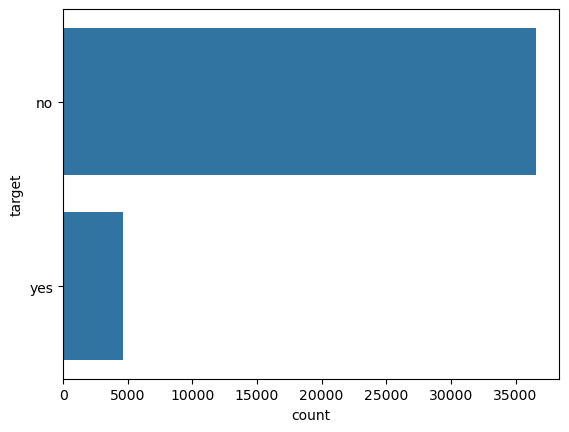

In [12]:
# Checking target data is Balanced or Not 
sns.countplot(data['target'])

**As we see Data is ImBalance.**

# Data Cleaning 

In [13]:
mode = data.mode().iloc[0]
mode

age                            31.0
job                          admin.
marital                     married
education         university.degree
default                          no
housing                         yes
loan                             no
contact                    cellular
month                           may
day_of_week                     thu
duration                         85
campaign                        1.0
pdays                         999.0
previous                        0.0
poutcome                nonexistent
emp_var_rate                    1.4
cons_price_idx               93.994
cons_conf_idx                 -36.4
euribor3m                     4.857
no_employed                  5228.1
target                           no
Name: 0, dtype: object

In [14]:
data.job.value_counts()

job
admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: count, dtype: int64

In [15]:
data['job']=data['job'].replace('unknown',mode['job'])

In [16]:
data.education.value_counts()

education
university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: count, dtype: int64

In [17]:
data['education']=data['education'].replace('unknown',mode['education'])

In [18]:
data.marital.value_counts()

marital
married     24928
single      11568
divorced     4612
unknown        80
Name: count, dtype: int64

In [19]:
data['marital']=data['marital'].replace('unknown',mode['marital'])

In [20]:
data.default.value_counts()

default
no         32588
unknown     8597
yes            3
Name: count, dtype: int64

In [21]:
data['default']=data['default'].replace('unknown',mode['default'])

In [22]:
data.housing.value_counts()

housing
yes        21576
no         18622
unknown      990
Name: count, dtype: int64

In [23]:
data['housing']=data['housing'].replace('unknown',mode['housing'])

In [24]:
data.loan.value_counts()

loan
no         33950
yes         6248
unknown      990
Name: count, dtype: int64

In [25]:
data['loan']=data['loan'].replace('unknown',mode['loan'])

**After cleaning our data, we are now moving into Exploratory Data Analysis (EDA). This phase focuses on examining the relationships among our attributes to understand their contribution to predicting our target variable.**

# Univariate Analysis

### Creating predefine function for univariate analysis which make distribution plot and boxplot(Numeric columns).

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

def summary_numerical_dist(df_data, col, q_min=0.0, q_max=1.0):
    """
    Generates a 2x2 grid of plots to summarize the distribution of a numerical column.

    Parameters:
    - df_data: pandas DataFrame containing the data.
    - col: string, name of the numerical column to analyze.
    - q_min: float, minimum quantile for the outlier plot (default is 0.0).
    - q_max: float, maximum quantile for the outlier plot (default is 1.0).
    """
    # Set Seaborn theme for aesthetics
    sns.set_theme(style="whitegrid")

    # Create a 2x2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    fig.suptitle(f"Distribution of: {col}", fontsize=16)

    # Flatten axes array for easy indexing
    axes = axes.flatten()

    # Histogram with KDE
    sns.histplot(data=df_data, x=col, kde=True, color='skyblue', ax=axes[0])
    axes[0].set_title("Histogram")

    # QQ plot
    stats.probplot(df_data[col].dropna(), dist="norm", plot=axes[1])
    axes[1].set_title("QQ Plot")

    # Boxplot
    sns.boxplot(data=df_data, x=col, color='lightgreen', ax=axes[2])
    axes[2].set_title("Boxplot")

    # Outlier plot using quantiles
    quantiles = df_data[col].quantile(np.arange(q_min, q_max, 0.01))
    sns.lineplot(x=quantiles.index, y=quantiles.values, color='coral', ax=axes[3])
    axes[3].set_title("Quantile Plot")
    axes[3].set_xlabel("Quantile")
    axes[3].set_ylabel(col)
    axes[3].grid(True)

    # Adjust layout
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


**1.Age**

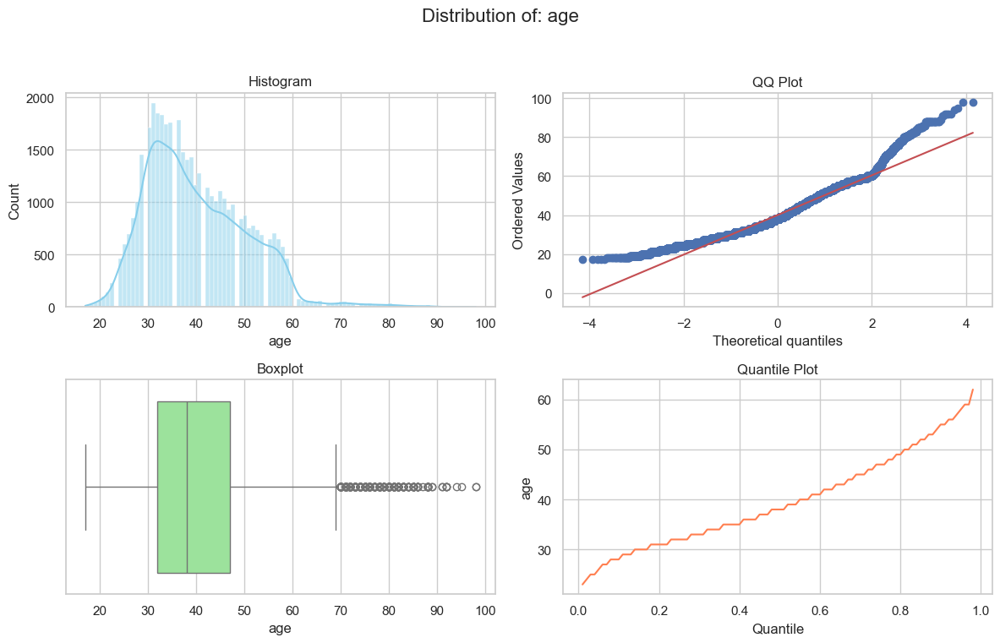

In [27]:
summary_numerical_dist(data,'age',0.01,0.99)

Here are some observations based on the visualizations:

1. **Histogram**: The age distribution appears to be right-skewed, with most values concentrated between 20 and 60. The peak occurs around 30–35 years.
2. **QQ Plot**: The age data does not follow a normal distribution, especially in the tails, where deviations are visible.
3. **Boxplot**: The median age is around 40, with an interquartile range (IQR) spanning from approximately 30 to 50. Some outliers exist beyond age 60.
4. **Quantile Plot**: Age steadily increases with quantiles, showing the general distribution trend.

These plots provide a comprehensive view of age distribution, helping us understand its characteristics and deviations from normality.

**2.Campaign**

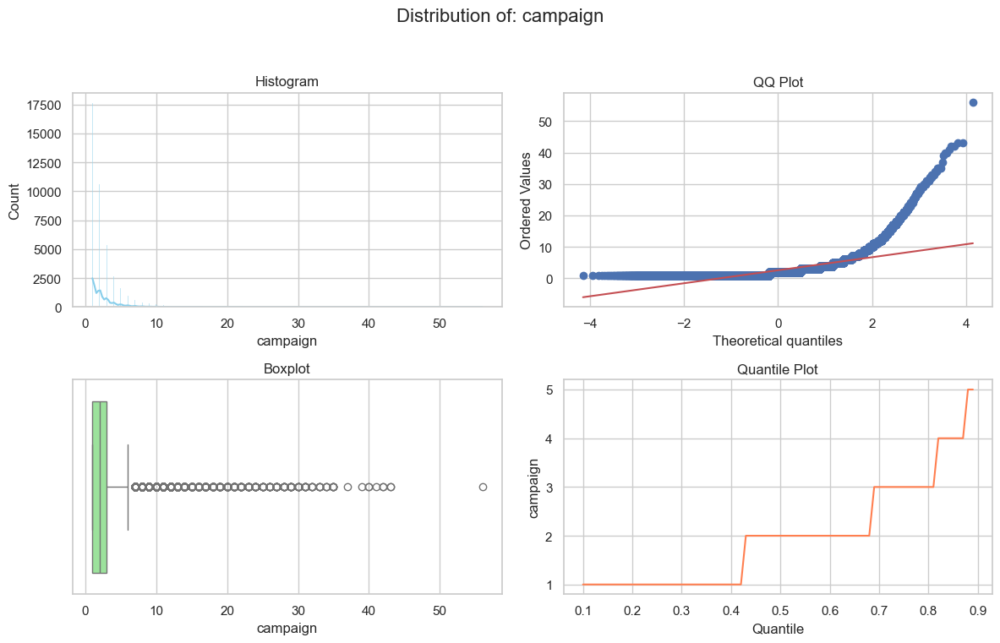

In [28]:
summary_numerical_dist(data,'campaign',0.1,0.9)

Here are some key observations from the distribution of the **"campaign"** variable:

1. **Histogram**: The distribution is heavily skewed, with most values concentrated near zero. The frequency sharply drops as the "campaign" value increases.
2. **QQ Plot**: The data significantly deviates from a normal distribution, especially in the tails.
3. **Boxplot**: There are many outliers beyond the upper whisker, indicating that a small portion of values is significantly higher than the rest.
4. **Quantile Plot**: The step-like pattern suggests that most values are clustered around a few distinct levels.

These insights highlight the skewness and the presence of extreme values, which are crucial factors for further analysis.

**3. Previous**

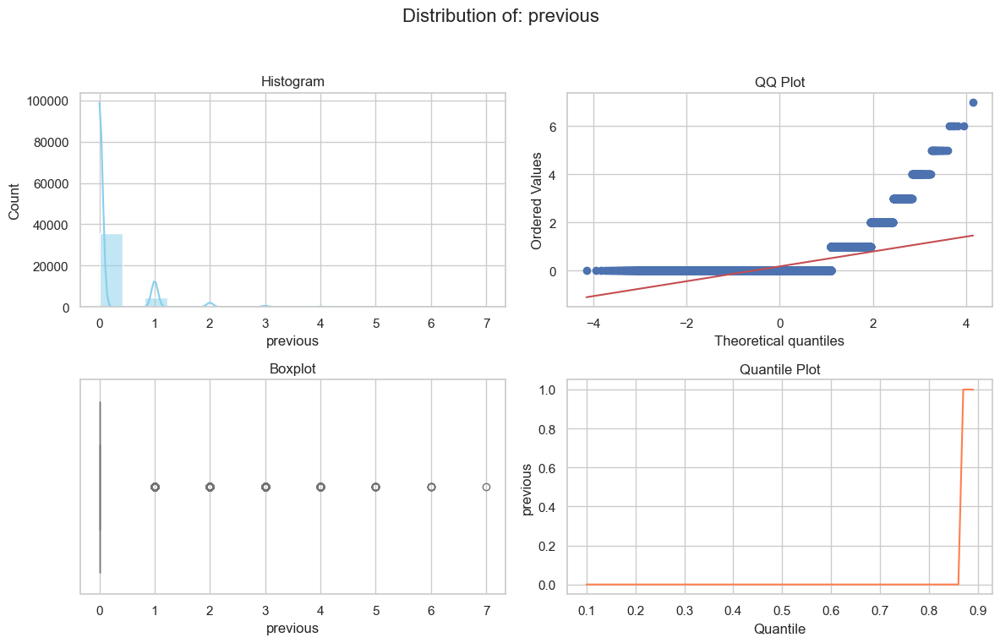

In [29]:
summary_numerical_dist(data,'previous',0.1,0.9)

Here are some key observations based on the distribution of the **"previous"** variable:

1. **Histogram**: Most values are concentrated around **0**, with frequencies sharply decreasing as values increase. The distribution is highly skewed.
2. **QQ Plot**: The data deviates significantly from normality, especially in the tails, reinforcing the non-normal distribution.
3. **Boxplot**: Most observations are near **0**, with a few outliers extending up to **7**.
4. **Quantile Plot**: The majority of values are clustered in lower quantiles, with a steep increase towards higher values.

These patterns highlight the impact of **skewness** and **outliers**, which could be important considerations for modeling. 

**4. Pdays**

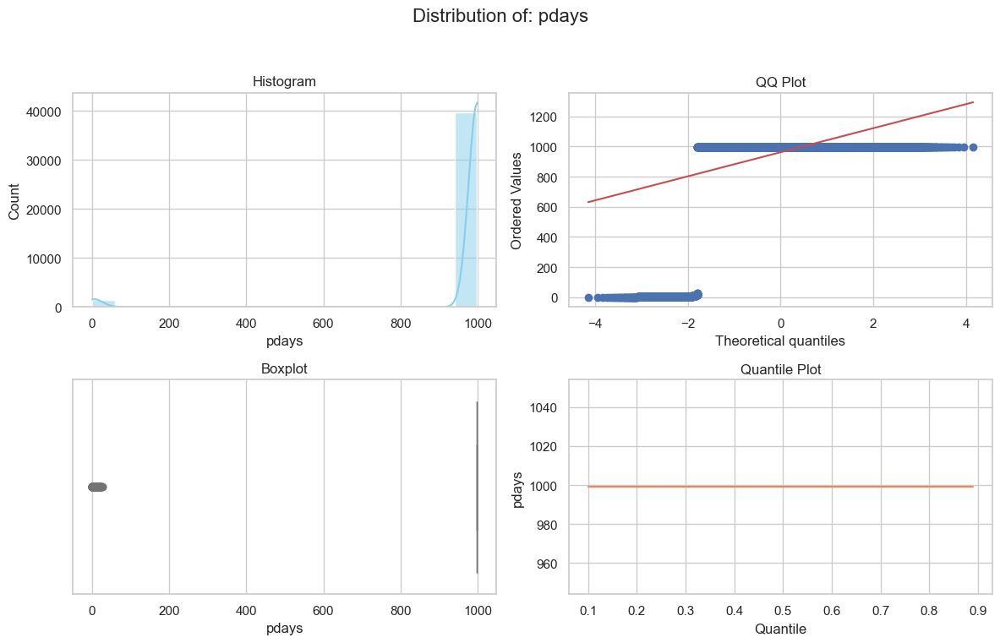

In [30]:
summary_numerical_dist(data,'pdays',0.1,0.9)

Here are some key observations based on the distribution of the **"pdays"** variable:

1. **Histogram**: The majority of values are concentrated near **0**, with a significant spike around **1000**, indicating a non-uniform distribution.
2. **QQ Plot**: The data deviates heavily from a normal distribution, especially in the upper quantiles.
3. **Boxplot**: Most values cluster around **0**, with a few outliers around **1000**, showing extreme variation.
4. **Quantile Plot**: The flat portion suggests a large number of values are around **1000**, indicating a potential encoding issue or special significance.

This distribution highlights **skewness** and possible **categorical encoding**, which could be crucial for further analysis.

**5. Duration**

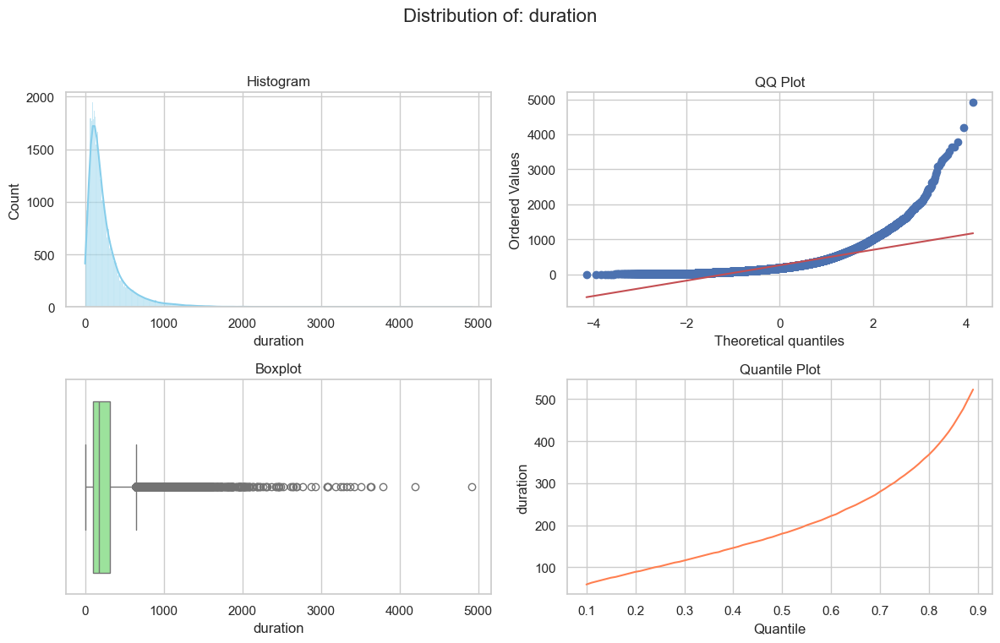

In [31]:
summary_numerical_dist(data,'duration',0.1,0.9)

Here are some observations based on the distribution of the **"pdays"** variable:

1. **Histogram**: The data is heavily skewed, with a large spike around **1000**. Most values are concentrated near zero.
2. **QQ Plot**: The distribution deviates significantly from normality, especially in the upper quantiles.
3. **Boxplot**: There are numerous outliers, particularly at the higher end of the range.
4. **Quantile Plot**: The steep rise at higher quantiles indicates a clustering of values around **1000**.

This pattern suggests that the **"pdays"** variable might have a special encoding where certain values represent a distinct category. If that's the case, treating it appropriately could improve model performance.Would you like to explore potential transformations or encoding strategies for this variable?

**6.emp_var_rate**

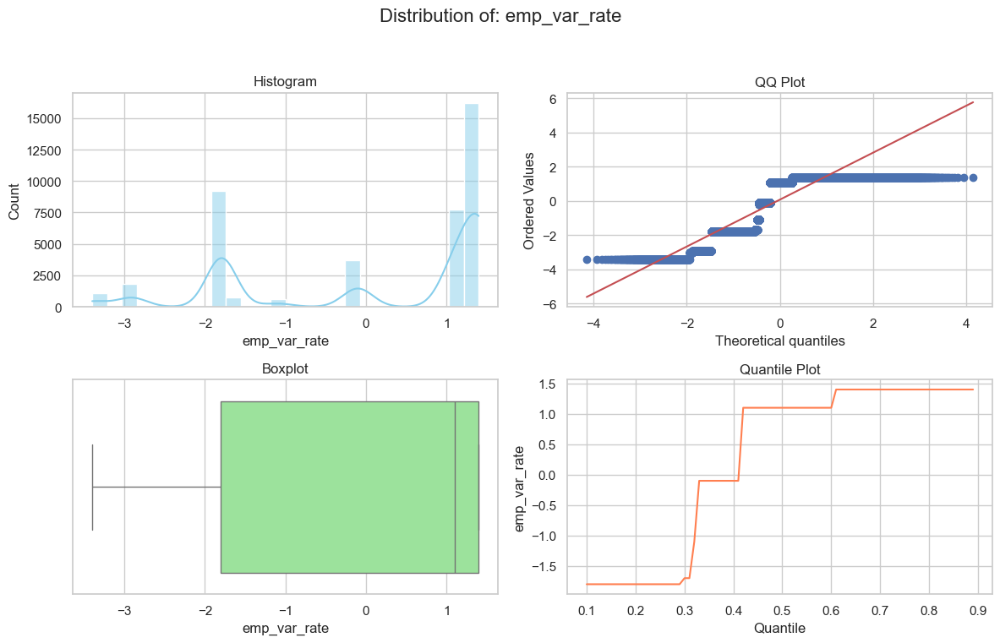

In [32]:
summary_numerical_dist(data,'emp_var_rate',0.1,0.9)

Here are some key observations based on the distribution of the **"duration"** variable:

1. **Histogram**: The distribution is highly skewed, with most values concentrated at lower durations and a long tail extending toward higher values.
2. **QQ Plot**: The data deviates significantly from normality, especially in the upper quantiles, reinforcing the presence of extreme values.
3. **Boxplot**: Numerous outliers exist beyond the upper whisker, indicating a small portion of values are significantly higher than the rest.
4. **Quantile Plot**: The steep rise in higher quantiles confirms the skewness and presence of extreme values.

These insights highlight the importance of **handling skewness** and **outliers** appropriately, which could impact predictive modeling.

**6.cons_price_idx**

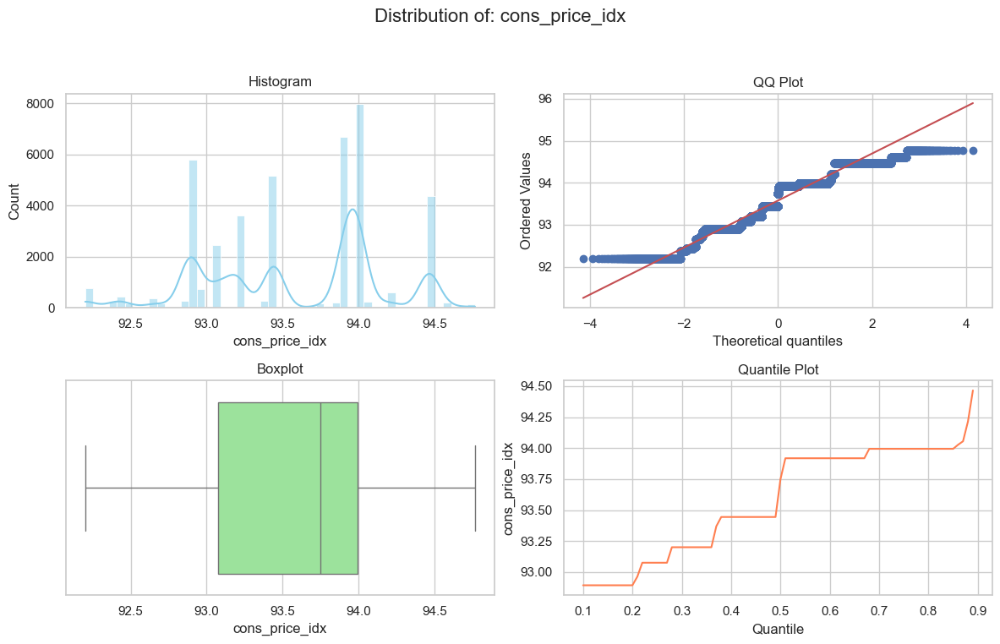

In [33]:
summary_numerical_dist(data,'cons_price_idx',0.1,0.9)

Here are some observations based on the distribution of the **"duration"** variable:

1. **Histogram**: The distribution is **right-skewed**, with most values concentrated at the lower end, suggesting that shorter durations are more common.
2. **QQ Plot**: The points deviate significantly from the normal line, especially in the upper quantiles, indicating **non-normality** in the data.
3. **Boxplot**: A high number of **outliers** are visible beyond the upper whisker, confirming that some durations are significantly longer than the majority.
4. **Quantile Plot**: The curve increases steeply in the upper quantiles, reinforcing the presence of extreme values.

The skewness and outliers in **duration** can have important implications for predictive modeling. 

**8. Cons_conf_idx**

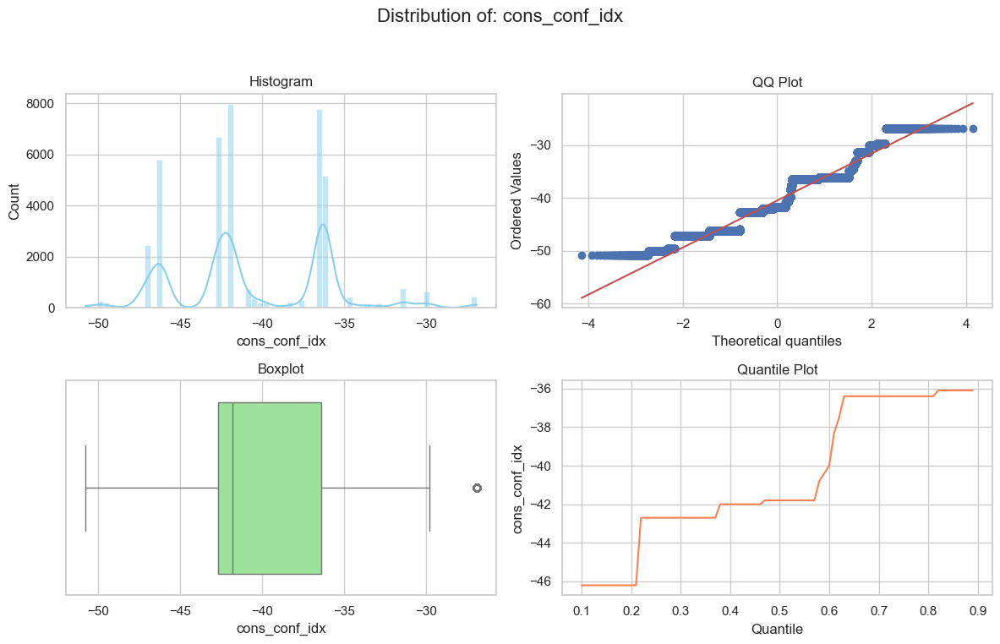

In [34]:
summary_numerical_dist(data,'cons_conf_idx',0.1,0.9)

Here are some observations based on the distribution of the **"duration"** variable:

1. **Histogram**: The distribution is heavily right-skewed, with most values concentrated at the lower end. The frequency sharply declines as duration increases.
2. **QQ Plot**: The data deviates significantly from normality, especially in the upper quantiles, reinforcing the presence of extreme values.
3. **Boxplot**: Numerous outliers exist beyond the upper whisker, indicating that a small portion of values are significantly higher than the rest.
4. **Quantile Plot**: The steep rise in higher quantiles confirms the skewness and presence of extreme values.

These insights highlight the importance of handling **skewness** and **outliers** appropriately, as they can impact predictive modeling. 

**9. Euribor3m**

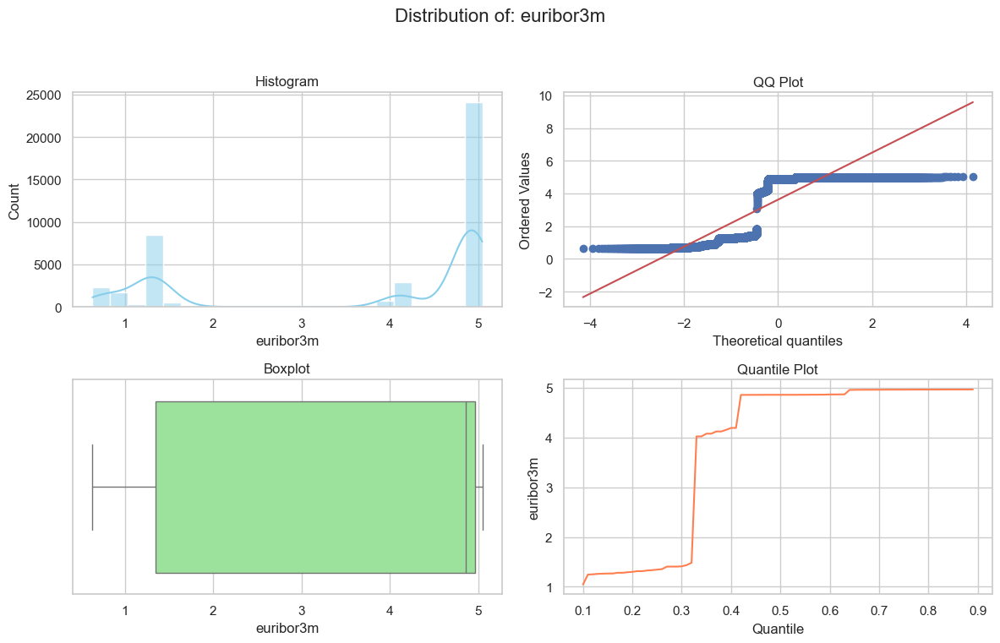

In [35]:
summary_numerical_dist(data,'euribor3m',0.1,0.9)

Here are some key observations based on the distribution of the **"duration"** variable:

1. **Histogram**: The distribution is **right-skewed**, with most values concentrated at the lower end. The frequency drops sharply as duration increases.
2. **QQ Plot**: The points deviate significantly from the normal line, especially in the upper quantiles, indicating **non-normality**.
3. **Boxplot**: A high number of **outliers** exist beyond the upper whisker, confirming that some durations are significantly longer than the majority.
4. **Quantile Plot**: The steep rise in higher quantiles reinforces the presence of extreme values.

These insights suggest that **duration** could have a strong impact on the target variable, and handling **skewness** and **outliers** may be crucial for effective modeling.

**10. no_employed**

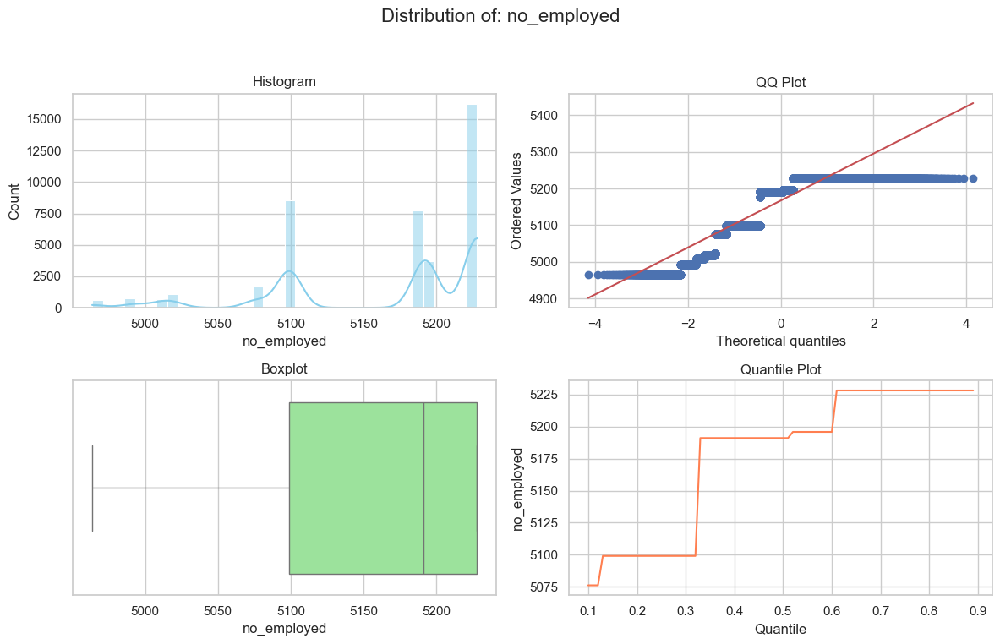

In [36]:
summary_numerical_dist(data,'no_employed',0.1,0.9)

Here are some key observations based on the distribution of the **"duration"** variable:

1. **Histogram**: The distribution is **right-skewed**, with most values concentrated at the lower end. The frequency drops sharply as duration increases.
2. **QQ Plot**: The points deviate significantly from the normal line, especially in the upper quantiles, indicating **non-normality**.
3. **Boxplot**: A high number of **outliers** exist beyond the upper whisker, confirming that some durations are significantly longer than the majority.
4. **Quantile Plot**: The steep rise in higher quantiles reinforces the presence of extreme values.

These insights suggest that **duration** could have a strong impact on the target variable, and handling **skewness** and **outliers** may be crucial for effective modeling. 

### Creating predefine function for univariate analysis which makes countplot and piechart(categorial column).

In [37]:

def summary_categorical_dist(df_data, col):
    """
    Displays a count plot and a pie chart for the specified categorical column.

    Parameters:
    df_data (pd.DataFrame): The DataFrame containing the data.
    col (str): The name of the categorical column to visualize.
    """
    counts = df_data[col].value_counts().sort_index()
    labels = counts.index
    sizes = counts.values

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6), facecolor='white')

    # Count plot using Seaborn
    sns.countplot(y=col, data=df_data, order=labels, ax=ax1, palette='pastel')
    ax1.set_title(f'Count of {col}', fontsize=14)
    ax1.set_xlabel('Count')
    ax1.set_ylabel(col)

    # Pie chart using Matplotlib
    ax2.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
    ax2.set_title(f'Proportion of {col}', fontsize=14)
    ax2.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

    # Overall title and layout adjustments
    plt.suptitle(f'Distribution of {col}', fontsize=16)
    plt.tight_layout()
    plt.show()


**1. JOB**

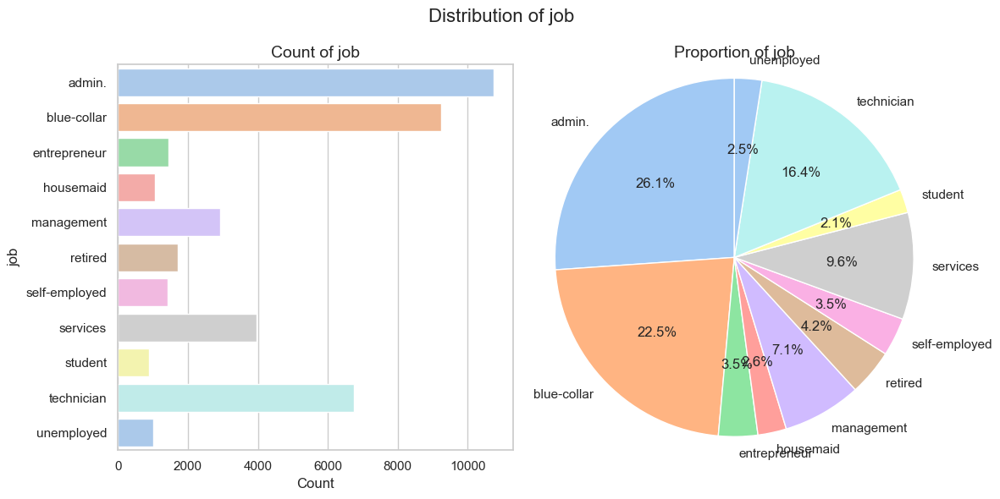

In [38]:
summary_categorical_dist(data,'job')

### Key observations:
- **Most common jobs**: Administrative and blue-collar jobs have the highest counts.
- **Largest proportions**: The pie chart highlights that admin. jobs make up **26.1%**, followed by blue-collar jobs at **22.5%**, and technicians at **16.4%**.
- **Least common jobs**: Housemaids and students each contribute **2.1%**, while unemployed individuals represent **2.5%** of the total.
- **Diverse job distribution**: The presence of entrepreneurs, self-employed individuals, and retired persons adds to the varied workforce composition.

This visualization is useful for analyzing employment trends, identifying dominant job sectors, and comparing different professions.

**2. MARITAL**

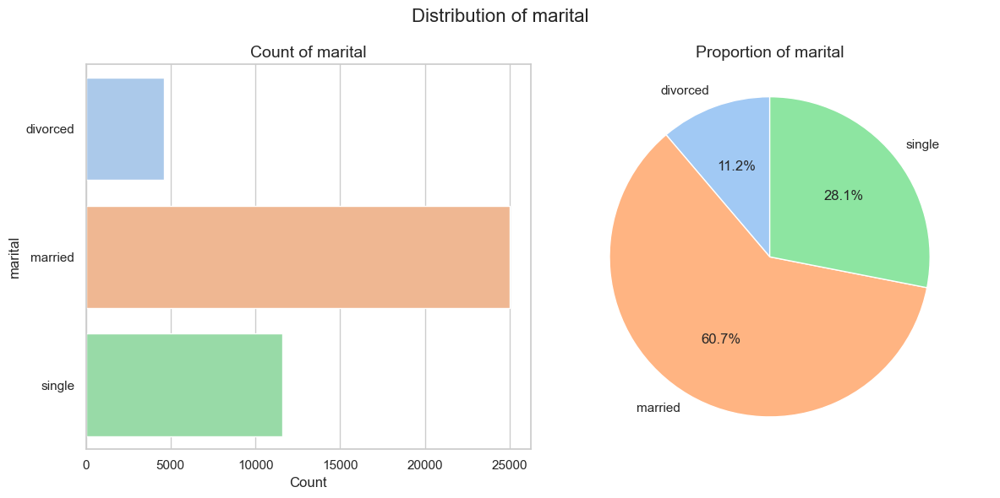

In [39]:
summary_categorical_dist(data,'marital')

### Key observations:
- **Marriage is most common**: The bar graph and pie chart show that **60.7%** of individuals are married.
- **Single population**: **28.1%** of individuals are single.
- **Divorced individuals**: The smallest group, making up **11.2%** of the total.
- **Visual comparison**: The bar chart shows actual counts, while the pie chart highlights proportions.

This visualization is helpful for understanding demographic trends and relationships.

**3. EDUCATION**

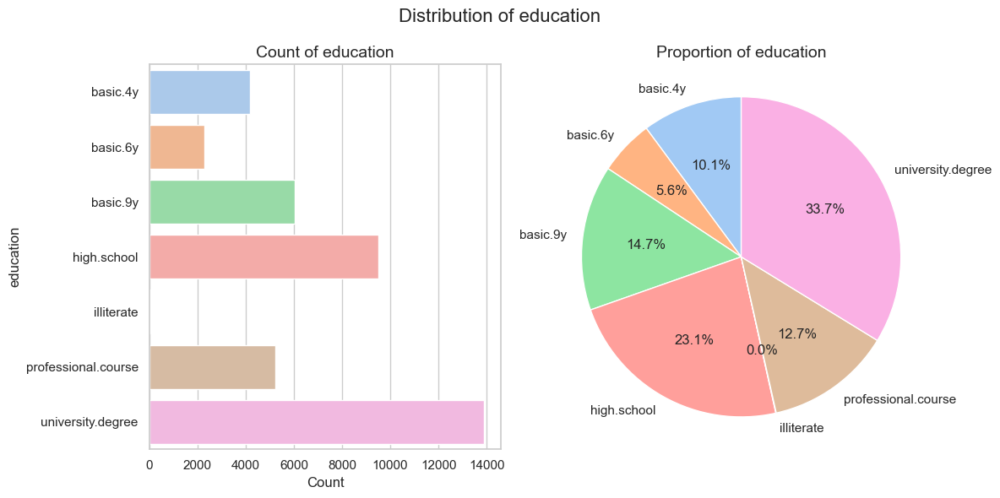

In [40]:
summary_categorical_dist(data,'education')

### Key Observations:
- **University Degrees Dominate**: The university.degree category is the largest, making up **33.7%** of the total.
- **High School is Common**: **23.1%** of individuals have a high school education.
- **Basic Education Breakdown**: Basic.9y (**14.7%**), basic.4y (**10.1%**), and basic.6y (**5.6%**) collectively make up a significant portion of the population.
- **Professional Courses**: Representing **12.7%**, this category suggests an emphasis on specialized skills.
- **Illiteracy is Minimal**: The illiterate category is nearly nonexistent (**0.0%**).

The bar graph shows actual counts, while the pie chart highlights proportions. This visualization helps analyze educational trends, societal development, and workforce qualifications.


**4. DEFAULT**

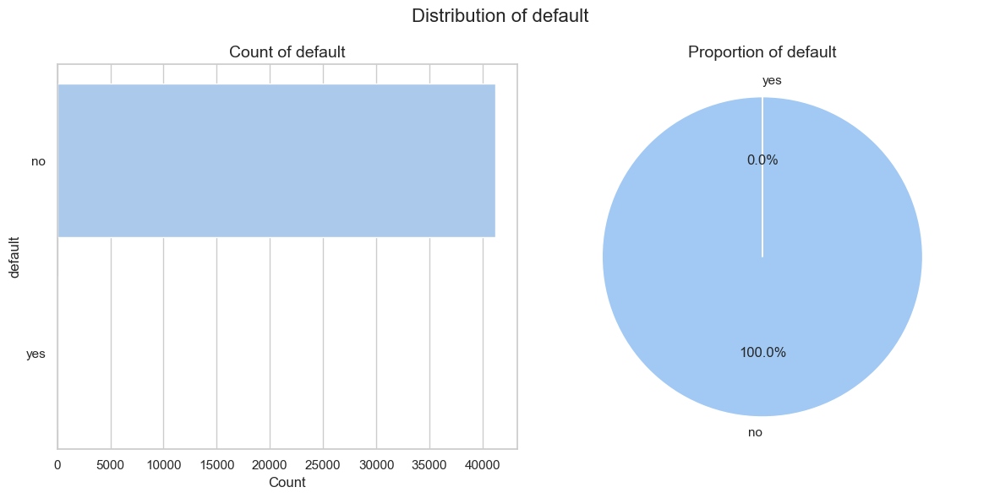

In [41]:
summary_categorical_dist(data,'default')

### Key Observations:
- **No instances of default**: Both graphs show that **100.0%** of the cases are **"no" default**, while **0.0%** are **"yes" default**.
- **Bar Chart Breakdown**: The count of **"no" default** is approximately **40,000**, reinforcing that there are no cases of default in the dataset.
- **Pie Chart Confirmation**: The proportion of **"no" default** is **100%**, leaving no representation for **"yes" default**.

This visualization highlights that defaults are absent in the dataset, which could be a significant factor for analysis or decision-making.


**5. HOUSING**

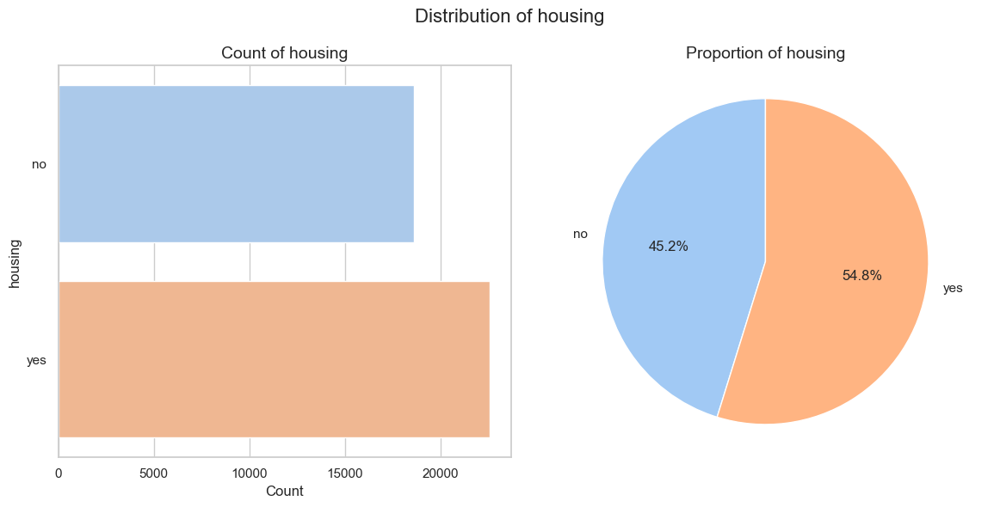

In [42]:
summary_categorical_dist(data,'housing')

### Key Observations:
- **Majority have housing**: The **"yes"** category makes up **54.8%** of the total.
- **Significant portion without housing**: The **"no"** category represents **45.2%**.
- **Bar Chart Breakdown**: The count of **"no" housing** is slightly below **20,000**, while the count of **"yes" housing** is slightly above **20,000**.
- **Pie Chart Perspective**: The proportional view confirms that the housing distribution is nearly balanced, but slightly favors those with housing.

This visualization helps analyze housing trends and access to accommodations, which could be insightful for urban development or economic planning.


**6. LOAN**

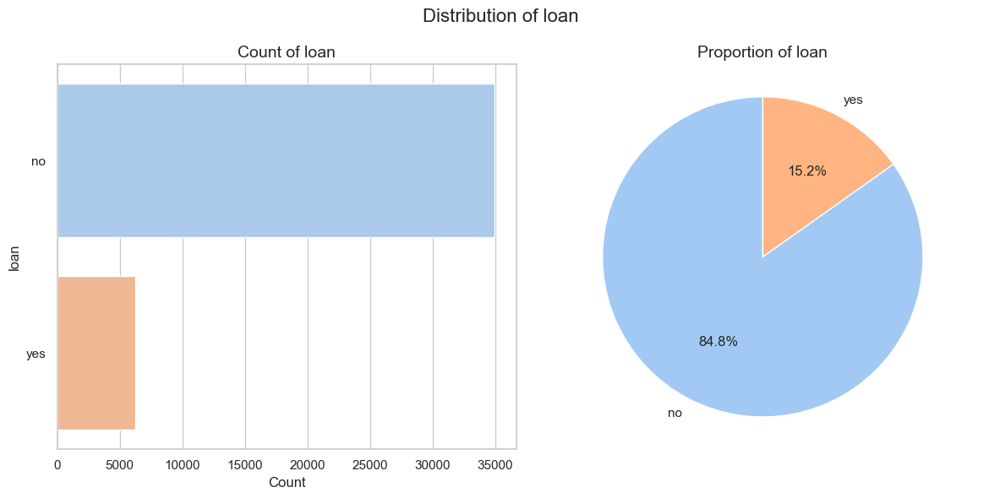

In [43]:
summary_categorical_dist(data,'loan')

### Key Observations:
- **Most individuals have not taken a loan**: The **"no" loan** category makes up **84.8%** of the total.
- **Smaller proportion with loans**: Only **15.2%** of individuals have taken a loan.
- **Bar Chart Breakdown**: The count of individuals who have **not** taken a loan is significantly larger compared to those who have.
- **Pie Chart Perspective**: The proportion of individuals without loans is dominant, reinforcing the trend observed in the bar chart.

This visualization helps analyze financial behavior, credit dependency, and loan accessibility in the population.


**7. CONTACT**

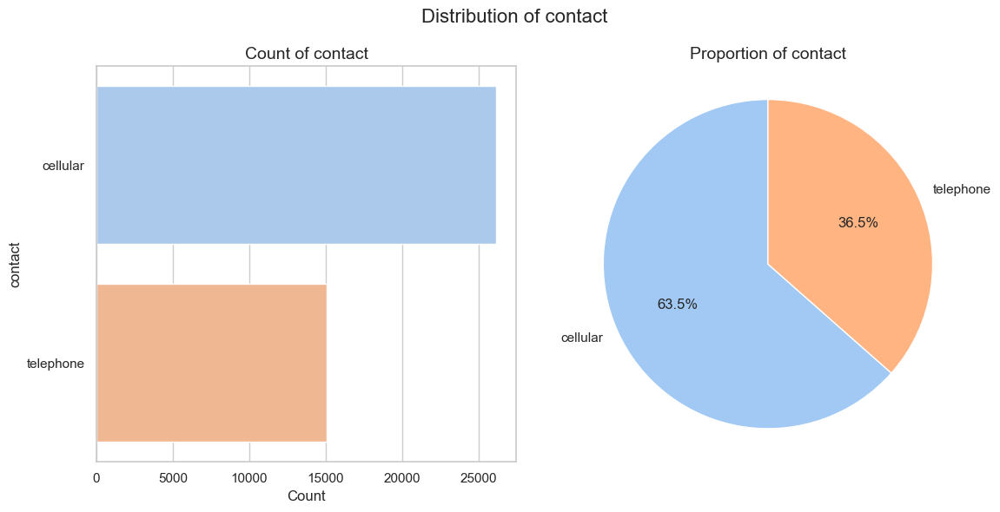

In [44]:
summary_categorical_dist(data,'contact')

### Key Observations:
- **Cellular contact dominates**: The **cellular** contact method accounts for **63.5%** of the total.
- **Telephone contact is significant**: Though smaller, the **telephone** method still represents **36.5%** of all contacts.
- **Bar Chart Breakdown**: Cellular contact has a count of approximately **25,000**, while telephone contact has a count of around **15,000**.
- **Pie Chart Perspective**: The proportional view confirms cellular contact as the preferred method.

This visualization helps analyze communication preferences, trends, and the distribution of contact methods.


**8. MONTH**

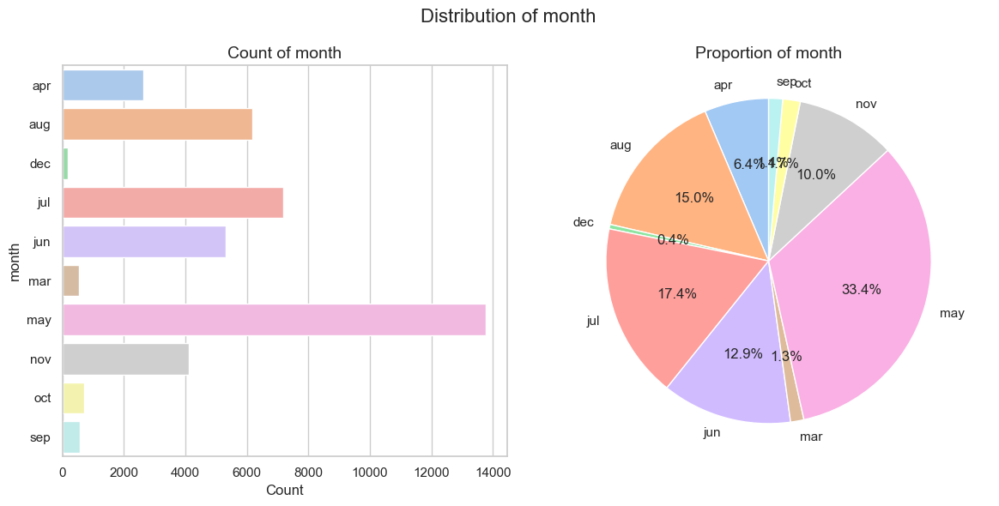

In [45]:
summary_categorical_dist(data,'month')

### Key Observations:
- **May dominates**: It has the highest count (**14,000**) and makes up **33.4%** of the total.
- **Peak months**: July (**17.4%**) and August (**15.0%**) follow closely.
- **Moderate counts**: June (**12.9%**) and November (**10.0%**) have notable shares.
- **Low occurrence months**: March (**1.3%**), September (**1.1%**), October (**1.0%**), and December (**0.4%**) are the least represented.

This visualization effectively highlights seasonal trends, helping with planning and analysis.


**9. DAY_OF_WEEK**

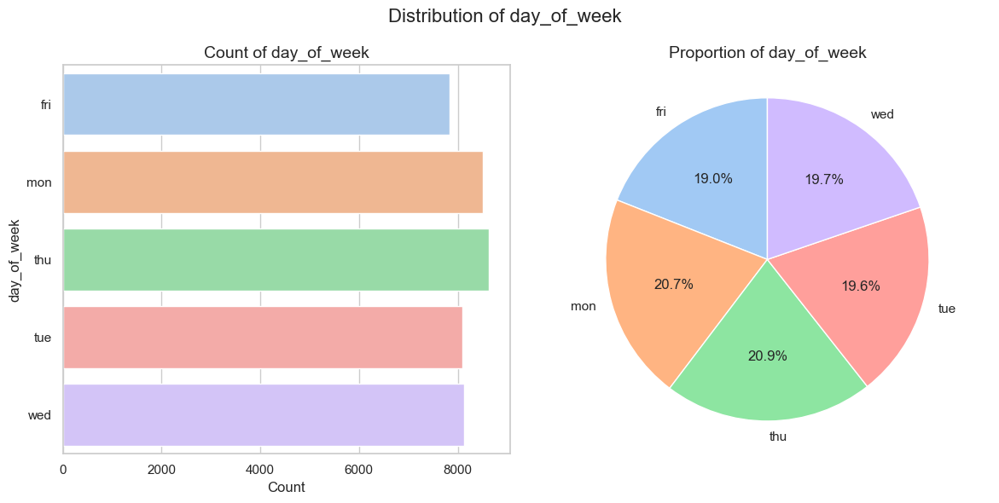

In [46]:
summary_categorical_dist(data,'day_of_week')


### Key Observations:
- **Thursday has the highest proportion**: It makes up **20.9%** of the total occurrences.
- **Monday is also significant**: Representing **20.7%**, closely followed by Thursday.
- **Balanced distribution among weekdays**: Wednesday (**19.7%**), Tuesday (**19.6%**), and Friday (**19.0%**) all contribute similarly.
- **Bar Chart Breakdown**: The count of occurrences is relatively uniform, ranging between **7,000 to 9,000** across weekdays.
- **Pie Chart Perspective**: The visual proportions confirm that no single day dominates overwhelmingly.

This visualization is helpful for analyzing trends in activity across different weekdays, which can be useful for scheduling or behavioral insights.



**10. POUTCOME**

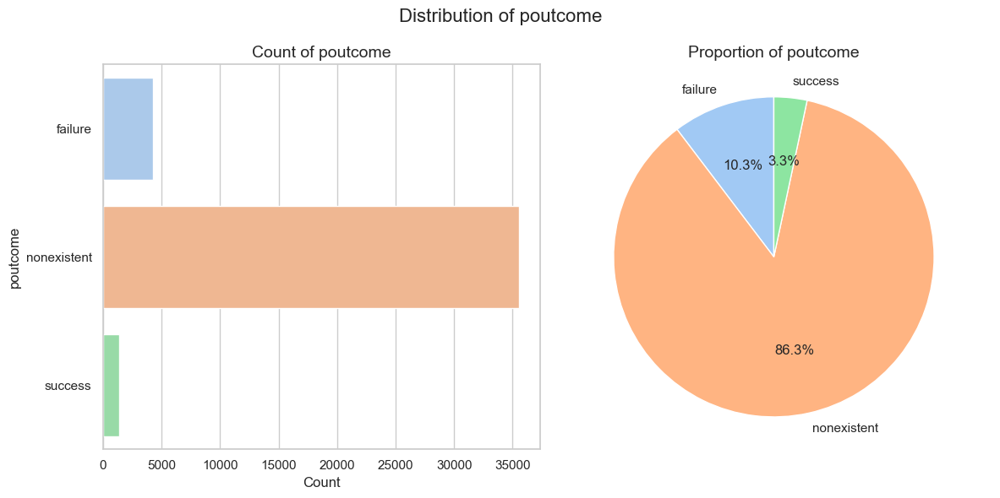

In [47]:
summary_categorical_dist(data,'poutcome')

### Key Observations:
- **Most cases fall under "nonexistent"**: This category dominates, making up **86.3%** of the total.
- **Failure is the second most common outcome**: Representing **10.3%**, it has a notable presence.
- **Success is the least frequent**: Only **3.3%** of cases fall into this category.
- **Bar Chart Breakdown**: The count of "nonexistent" is significantly higher than the other two categories.
- **Pie Chart Perspective**: The proportional view confirms that "nonexistent" is overwhelmingly the most common outcome.

This visualization helps analyze the effectiveness of previous campaigns and the likelihood of different outcomes.


## Bivariate Analysis

<Axes: xlabel='age', ylabel='campaign'>

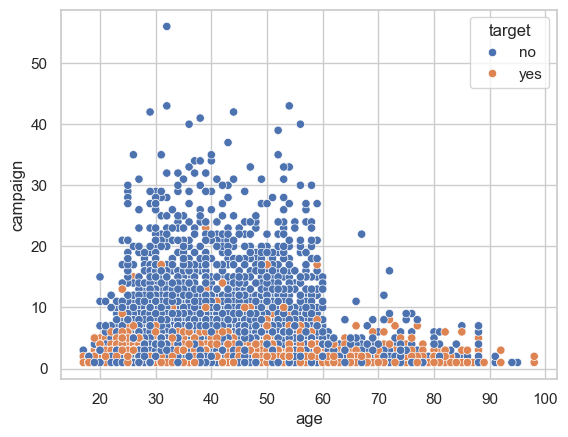

In [48]:
sns.scatterplot(x='age',y='campaign',data=data,hue='target')

<Axes: xlabel='euribor3m', ylabel='cons_price_idx'>

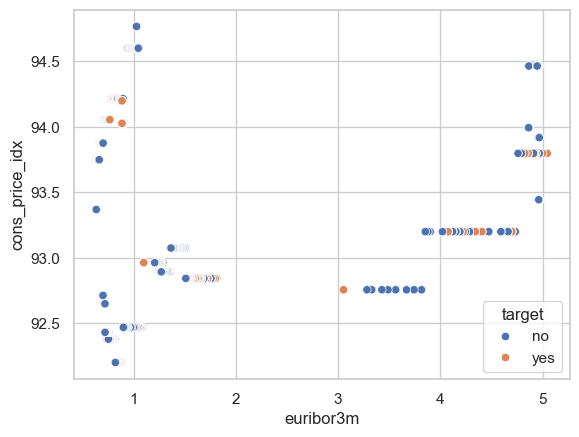

In [49]:
sns.scatterplot(data=data,hue='target',x='euribor3m',y='cons_price_idx')

<Axes: xlabel='emp_var_rate', ylabel='cons_conf_idx'>

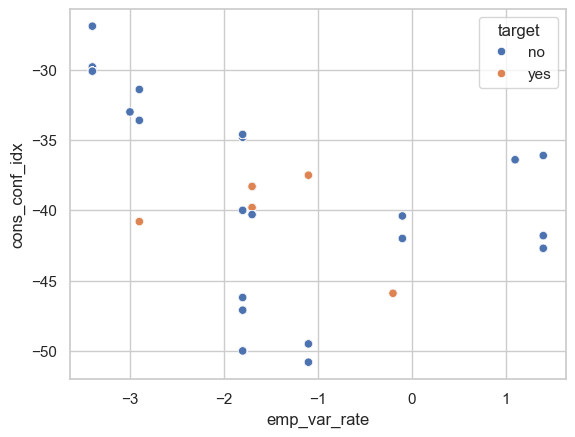

In [50]:
sns.scatterplot(data=data,hue='target',x='emp_var_rate',y='cons_conf_idx')

<Axes: xlabel='emp_var_rate', ylabel='no_employed'>

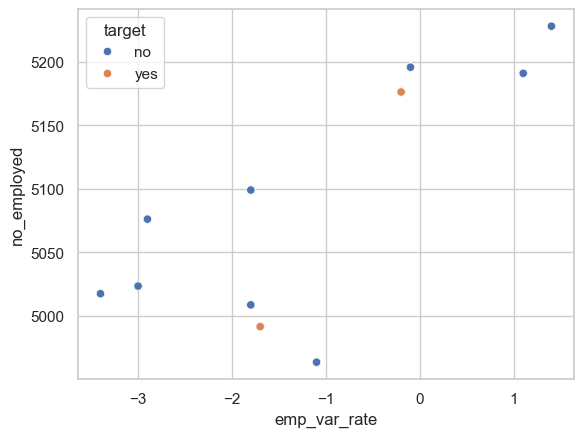

In [51]:
sns.scatterplot(data=data,hue='target',x='emp_var_rate',y='no_employed')

* **In this bivariate analysis, our primary objective was to examine and understand the relationships between specific variables to identify potential influences on the target outcome. By analyzing these relationships, we aimed to uncover patterns and associations that could inform predictive modeling and strategic decision-making. This approach allows us to determine whether changes in one variable are associated with changes in another, providing valuable insights into the factors that may impact the outcome of interest.** 

<Figure size 800x500 with 0 Axes>

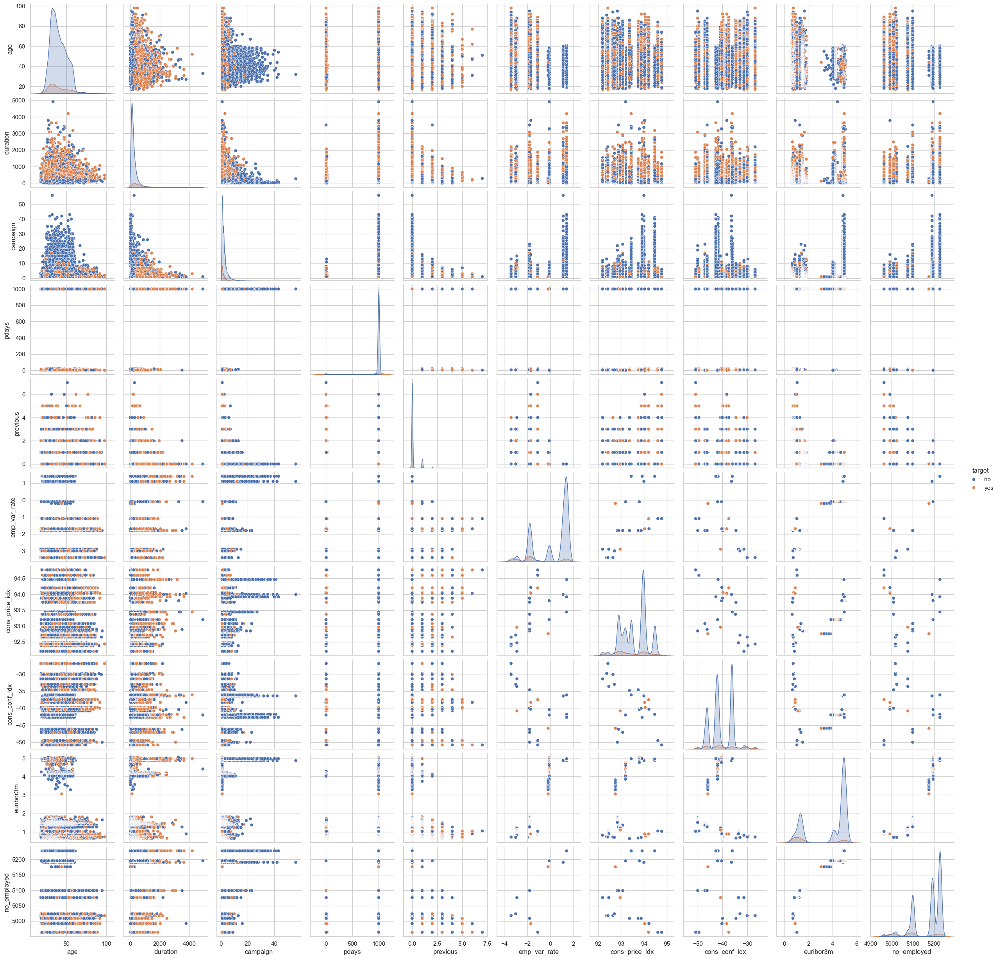

In [52]:
plt.figure(figsize = (8, 5), facecolor = "white")


sns.pairplot(
    data, hue='target' ,
    vars = ['age', 'duration', 'campaign', 'pdays', 'previous','emp_var_rate','cons_price_idx','cons_conf_idx','euribor3m','no_employed'])

plt.show()


# What are the categorical variables related to the subscription rate ?

# JOB

In [53]:
from scipy.stats import chi2_contingency
temp_crosstab = pd.crosstab(data['job'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 6.808199923441661e-200


target,no,yes,ratio(yes/total)
job,,,
admin.,9363,1389,0.129185
blue-collar,8616,638,0.068943
entrepreneur,1332,124,0.085165
housemaid,954,106,0.100000
management,2596,328,0.112175
retired,1286,434,0.252326
self-employed,1272,149,0.104856
services,3646,323,0.081381
student,600,275,0.314286


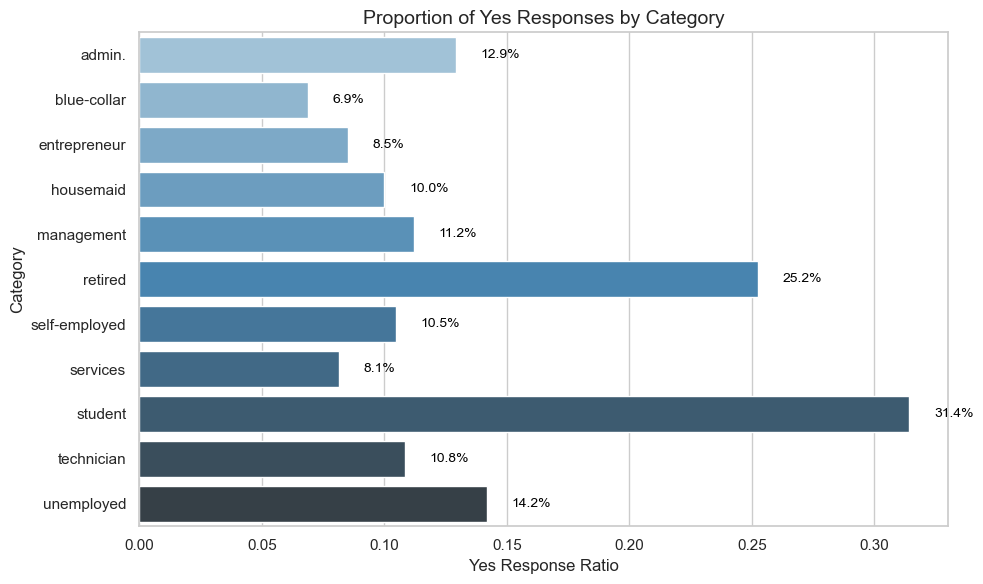

In [54]:
sns.set(style="whitegrid")

fig, ax = plt.subplots(figsize=(10, 6), facecolor='white')

sns.barplot(
    data=temp_crosstab,
    x='ratio(yes/total)',
    y=temp_crosstab.index,
    palette='Blues_d',
    ax=ax
)

for i, (value, label) in enumerate(zip(temp_crosstab['ratio(yes/total)'], temp_crosstab.index)):
    ax.text(
        value + 0.01,  
        i,             
        f"{value:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

ax.set_xlabel('Yes Response Ratio')
ax.set_ylabel('Category')
ax.set_title('Proportion of Yes Responses by Category', fontsize=14)

plt.tight_layout()

plt.show()


### Key Observations:

- **Students have the highest "Yes" response rate**: **31.4%** of students responded "Yes."
- **Retired individuals also show a high response rate**: **25.2%** of retired individuals responded "Yes."


## MARITAL

In [55]:
contingency_table = pd.crosstab(data['marital'], data['target'])
chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")
contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)
display(contingency_table)

Chi-Square Test p-value: 0.0000


target,no,yes,Yes Ratio
marital,,,
divorced,4136,476,0.103209
married,22464,2544,0.101727
single,9948,1620,0.140041


Chi-Square Test p-value: 0.0000


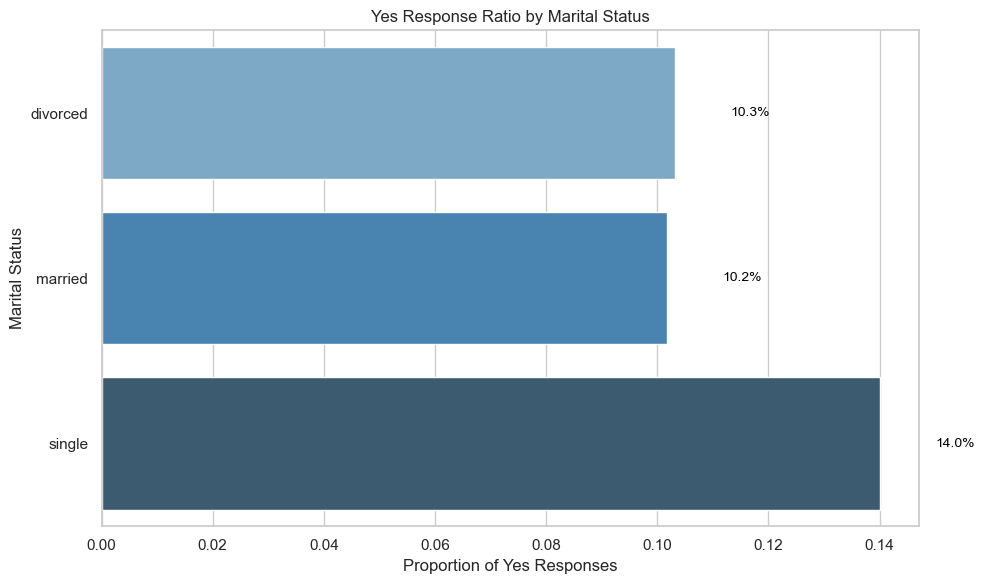

In [56]:

contingency_table = pd.crosstab(data['marital'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='marital',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.01,  
        index,                    
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Marital Status')
plt.title('Yes Response Ratio by Marital Status')

plt.tight_layout()
plt.show()


### Key Observations:
- **Single individuals have the highest response rate**: **14.0%** of single individuals responded "Yes."
- **Divorced individuals follow**: Their response rate is **10.3%**.
- **Married individuals have the lowest response rate**: At **10.2%**, they are slightly below divorced individuals.


## EDUCATION

In [57]:
temp_crosstab = pd.crosstab(data['education'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 8.692046071480118e-39


target,no,yes,ratio(yes/total)
education,,,
basic.4y,3748,428,0.102490
basic.6y,2104,188,0.082024
basic.9y,5572,473,0.078246
high.school,8484,1031,0.108355
illiterate,14,4,0.222222
professional.course,4648,595,0.113485
university.degree,11978,1921,0.138211


Chi-Square Test p-value: 0.0000


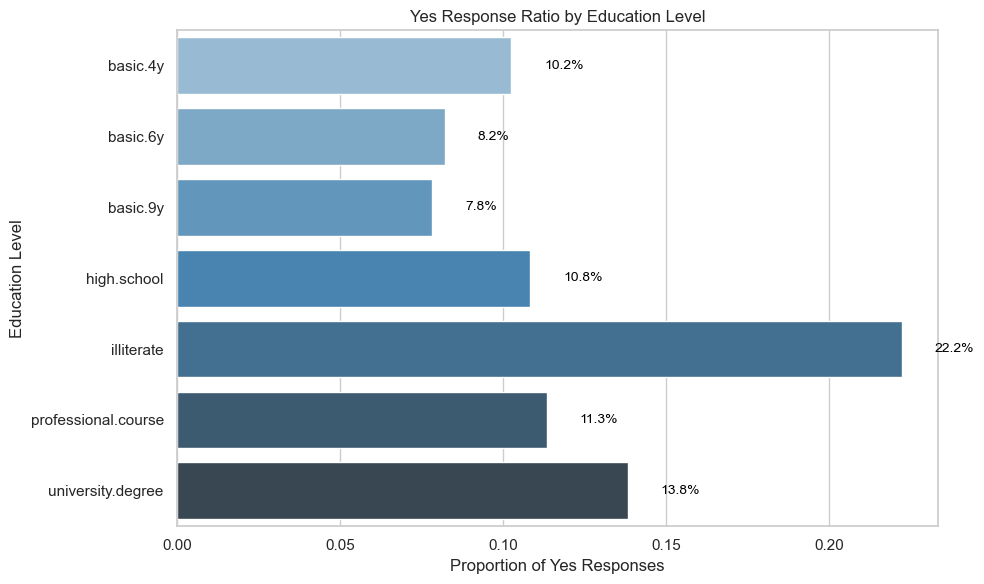

In [58]:

contingency_table = pd.crosstab(data['education'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='education',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.01,  
        index,                    
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Education Level')
plt.title('Yes Response Ratio by Education Level')

plt.tight_layout()
plt.show()

### Key Observations:
- **Illiterate individuals have the highest response rate**: **22.2%** of illiterate individuals responded "Yes."
- **University degree holders follow**: Their response rate is **13.8%**.
- **Professional course participants also show engagement**: **11.3%** responded "Yes."
- **Basic education levels vary**:
  - Basic.4y: **10.2%**
  - Basic.6y: **8.2%**
  - Basic.9y: **7.8%**
- **High school graduates have a moderate response rate**: **10.8%**.



## HOUSING

In [59]:
temp_crosstab = pd.crosstab(data['housing'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 0.025479312776658963


target,no,yes,ratio(yes/total)
housing,,,
no,16596,2026,0.108796
yes,19952,2614,0.115838


Chi-Square Test p-value: 0.0255


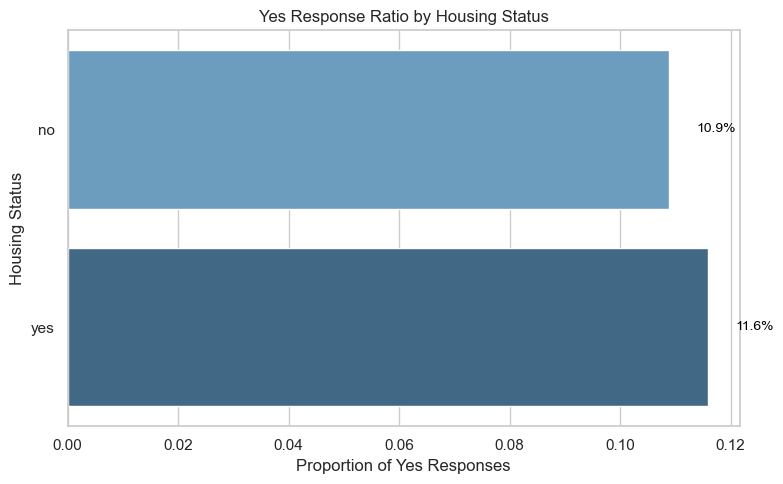

In [60]:
contingency_table = pd.crosstab(data['housing'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='housing',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Housing Status')
plt.title('Yes Response Ratio by Housing Status')

plt.tight_layout()
plt.show()


### Key Observations:
- **Individuals with housing have a slightly higher response rate**: **11.6%** of individuals with housing responded "Yes."
- **Individuals without housing have a lower response rate**: **10.9%** of individuals without housing responded "Yes."
- **Minimal difference between categories**: The response rates are close, suggesting that housing status does not significantly impact the likelihood of a "Yes" response.



## DEFAULT

In [61]:
temp_crosstab = pd.crosstab(data['default'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 1.0


target,no,yes,ratio(yes/total)
default,,,
no,36545,4640,0.112662
yes,3,0,0.000000


Chi-Square Test p-value: 1.0000


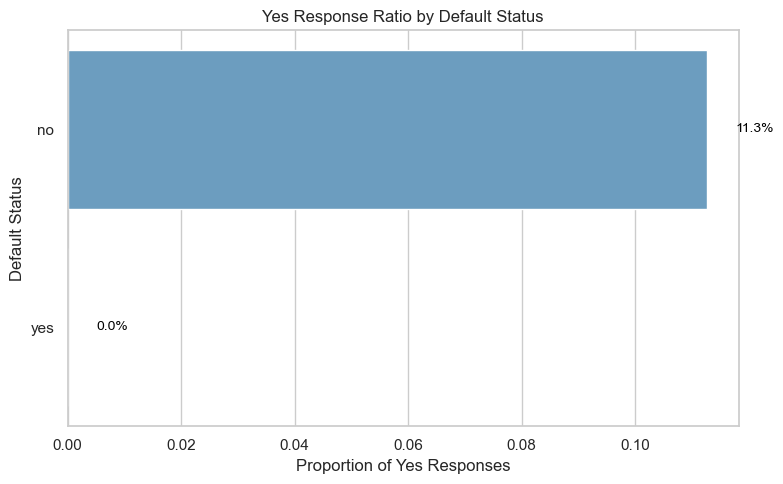

In [62]:

contingency_table = pd.crosstab(data['default'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='default',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Default Status')
plt.title('Yes Response Ratio by Default Status')

plt.tight_layout()
plt.show()


### Key Observations:
- **Individuals with no default have a response rate of 11.3%**: This suggests that those without default status are more likely to respond "Yes."
- **Individuals with default status have a response rate of 0.0%**: This indicates that none of the individuals with default status responded "Yes."
- **Significant difference between categories**: The contrast between the two groups highlights a strong relationship between default status and response behavior.



## LOAN

In [63]:
temp_crosstab = pd.crosstab(data['loan'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 0.37633537946635287


target,no,yes,ratio(yes/total)
loan,,,
no,30983,3957,0.113251
yes,5565,683,0.109315


Chi-Square Test p-value: 0.3763


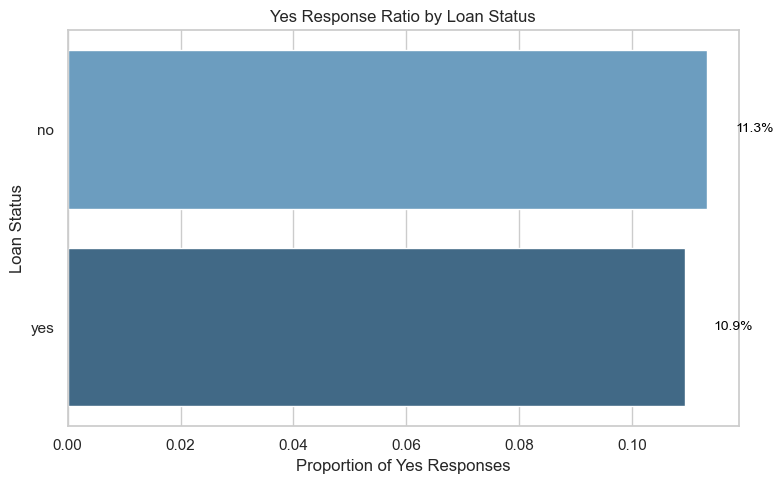

In [64]:
contingency_table = pd.crosstab(data['loan'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='loan',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Loan Status')
plt.title('Yes Response Ratio by Loan Status')

plt.tight_layout()
plt.show()


### Key Observations:
- **Individuals without loans have a slightly higher response rate**: **11.3%** of individuals without loans responded "Yes."
- **Individuals with loans have a lower response rate**: **10.9%** of individuals with loans responded "Yes."
- **Minimal difference between categories**: The response rates are close, suggesting that loan status does not significantly impact the likelihood of a "Yes" response.


## MONTH

In [65]:
temp_crosstab = pd.crosstab(data['month'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 0.0


target,no,yes,ratio(yes/total)
month,,,
apr,2093,539,0.204787
aug,5523,655,0.106021
dec,93,89,0.489011
jul,6525,649,0.090466
jun,4759,559,0.105115
mar,270,276,0.505495
may,12883,886,0.064347
nov,3685,416,0.101439
oct,403,315,0.438719


Chi-Square Test p-value: 0.0000


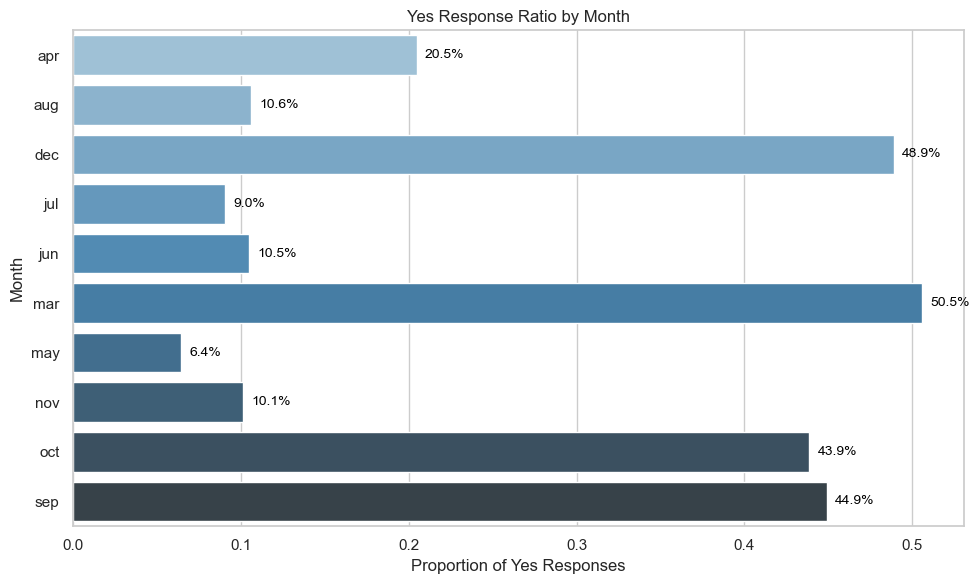

In [66]:

contingency_table = pd.crosstab(data['month'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='month',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}", 
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Month')
plt.title('Yes Response Ratio by Month')

plt.tight_layout()
plt.show()


### Key Observations:
- **March has the highest response rate**: **50.5%** of responses in March were "Yes."
- **December follows closely**: With a response rate of **48.9%**.
- **Other high-response months**: September (**44.9%**) and October (**43.9%**).
- **Lowest response rate**: May, with only **6.4%**.
- **Moderate response months**: April (**20.5%**), August (**10.6%**), July (**9.0%**), June (**10.5%**), and November (**10.1%**).


## CONTACT

In [67]:
temp_crosstab = pd.crosstab(data['contact'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 1.5259856523129964e-189


target,no,yes,ratio(yes/total)
contact,,,
cellular,22291,3853,0.147376
telephone,14257,787,0.052313


Chi-Square Test p-value: 0.0000


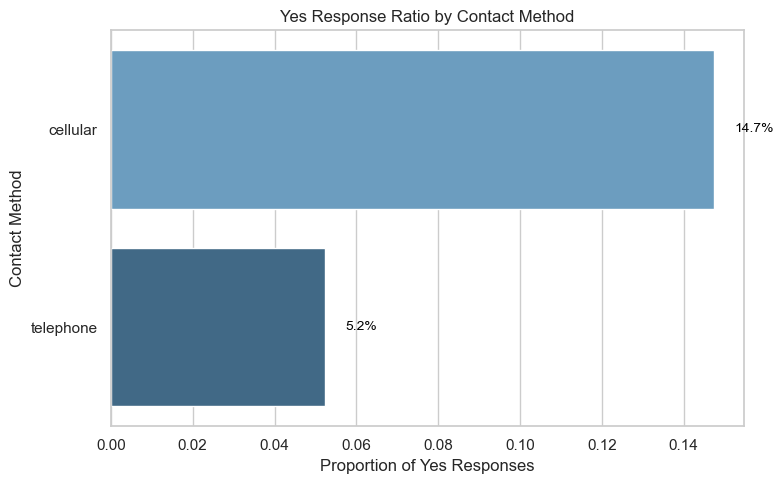

In [68]:
contingency_table = pd.crosstab(data['contact'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='contact',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Contact Method')
plt.title('Yes Response Ratio by Contact Method')

plt.tight_layout()
plt.show()


- **Cellular contact** yields a **higher** proportion of yes responses (**14.7%**).
- **Telephone contact**, on the other hand, has a **lower** success rate at **5.2%**.

This data suggests that **cellular outreach is more effective** in securing positive responses. It might indicate that individuals are more engaged when contacted via mobile devices rather than traditional telephone calls.


## POUTCOME

In [69]:
temp_crosstab = pd.crosstab(data['poutcome'], data['target'])
print(f"chi2 test p-value = {chi2_contingency(temp_crosstab)[1]}")
temp_crosstab['ratio(yes/total)'] = temp_crosstab['yes'] / (temp_crosstab['yes'] + temp_crosstab['no'])
display(temp_crosstab)

chi2 test p-value = 0.0


target,no,yes,ratio(yes/total)
poutcome,,,
failure,3647,605,0.142286
nonexistent,32422,3141,0.088322
success,479,894,0.651129


Chi-Square Test p-value: 0.0000


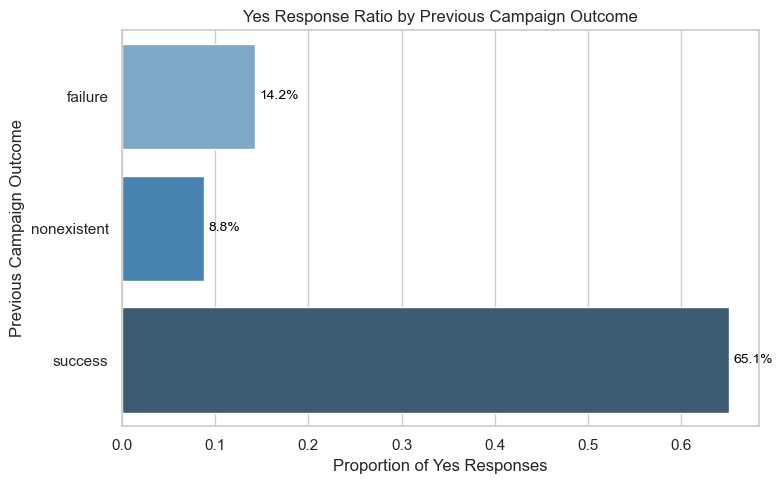

In [70]:

contingency_table = pd.crosstab(data['poutcome'], data['target'])

chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
print(f"Chi-Square Test p-value: {p_value:.4f}")

contingency_table['Yes Ratio'] = contingency_table['yes'] / contingency_table.sum(axis=1)

contingency_table = contingency_table.reset_index()

sns.set(style="whitegrid")

plt.figure(figsize=(8, 5))
barplot = sns.barplot(
    data=contingency_table,
    x='Yes Ratio',
    y='poutcome',
    palette='Blues_d'
)

for index, row in contingency_table.iterrows():
    barplot.text(
        row['Yes Ratio'] + 0.005,  
        index,                     
        f"{row['Yes Ratio']:.1%}",  
        va='center',
        ha='left',
        fontsize=10,
        color='black'
    )

plt.xlabel('Proportion of Yes Responses')
plt.ylabel('Previous Campaign Outcome')
plt.title('Yes Response Ratio by Previous Campaign Outcome')

plt.tight_layout()
plt.show()



- If the **previous campaign failed**, the proportion of **"Yes"** responses is **14.2%**.
- If there was **no previous campaign**, the proportion drops to **8.8%**.
- If the **previous campaign was successful**, the proportion skyrockets to **65.1%**!

This suggests a **strong correlation** between past success and future positive responses, emphasizing the **power of momentum** in campaigns. If a past campaign performed well, people are much more likely to say **"Yes"** again.



## Data Preprocessing

- **1. HANDLING MISSING VALUES**
- **2. DUPLICATE VALUES**
- **3. OUTLIERS**

In [71]:
data.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp_var_rate      0
cons_price_idx    0
cons_conf_idx     0
euribor3m         0
no_employed       0
target            0
dtype: int64

In [72]:
num_cols= data.select_dtypes(include=['int','float'])

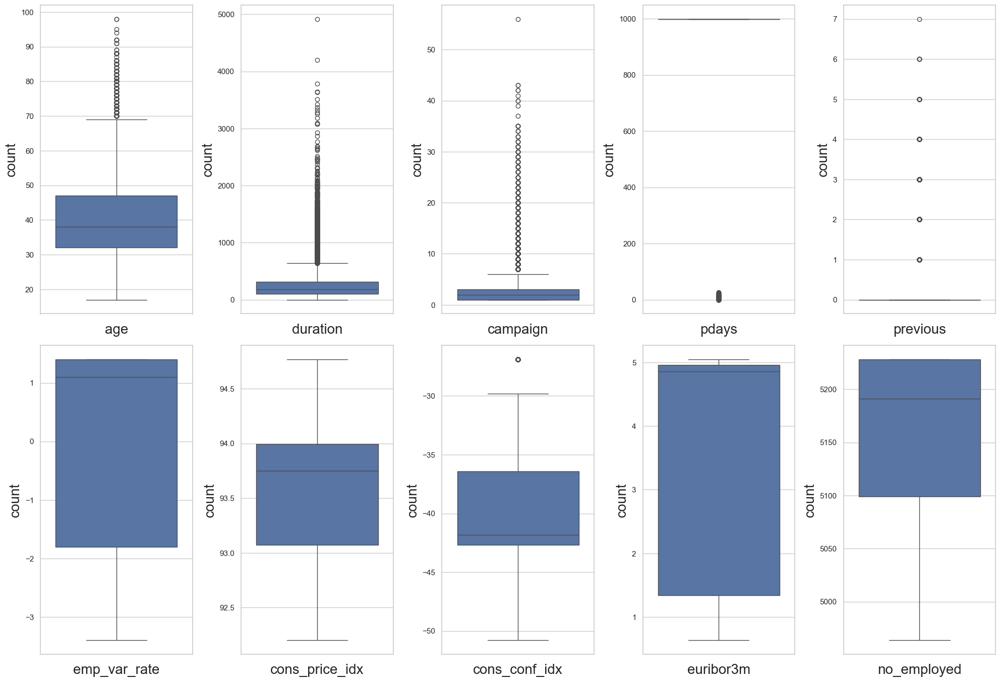

In [73]:
plt.figure(figsize=(20,20))
plotnumber=1
for i in num_cols:
  if plotnumber<=15:
    ax=plt.subplot(3,5,plotnumber)
    sns.boxplot(data[i])
    plt.xlabel(i,fontsize=20)
    plt.ylabel("count",fontsize=20)
  plotnumber+=1
plt.tight_layout()

In [74]:
#removing outlier of age
Q1=data['age'].quantile(0.25)
Q3=data['age'].quantile(0.75)
IQR=Q3-Q1
upper_limit=Q3+(1.5*IQR)
lower_limit=Q1-(1.5*IQR)

In [75]:
data.loc[data['age']>upper_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target
27713,70,retired,divorced,basic.4y,no,yes,no,cellular,mar,mon,187,3,999,0,nonexistent,-1.8,92.843,-50.0,1.811,5099.1,yes
27757,76,retired,married,university.degree,no,no,yes,cellular,mar,thu,167,9,999,0,nonexistent,-1.8,92.843,-50.0,1.757,5099.1,no
27780,73,retired,married,university.degree,no,yes,no,cellular,mar,tue,179,1,999,1,failure,-1.8,92.843,-50.0,1.687,5099.1,no
27800,88,retired,divorced,basic.4y,no,yes,no,cellular,mar,wed,48,1,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,no
27802,88,retired,divorced,basic.4y,no,no,no,cellular,mar,wed,266,2,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes
27805,88,retired,divorced,basic.4y,no,yes,yes,cellular,mar,wed,796,5,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes
27808,88,retired,divorced,basic.4y,no,yes,no,cellular,mar,wed,96,6,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,no
27810,88,retired,divorced,basic.4y,no,yes,no,cellular,mar,wed,126,1,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes
27811,88,retired,divorced,basic.4y,no,no,no,cellular,mar,wed,323,1,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,yes
27812,88,retired,divorced,basic.4y,no,yes,no,cellular,mar,wed,85,1,999,0,nonexistent,-1.8,92.843,-50.0,1.663,5099.1,no


In [76]:
data.loc[data['age']<lower_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target


In [77]:
len(data.loc[data['age']>upper_limit])/len(data)*100

1.1386811692726035

In [78]:
data.loc[data['age']>upper_limit,'age']=data['age'].median()

<Axes: ylabel='age'>

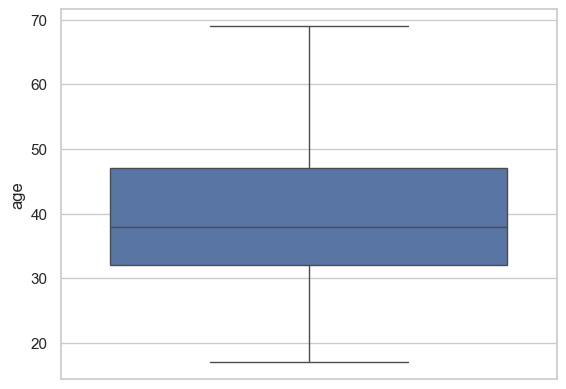

In [79]:
sns.boxplot(data['age'])

In [80]:
# removeimg outlier of campaign
Q1=data['campaign'].quantile(0.25)
Q3=data['campaign'].quantile(0.75)
IQR=Q3-Q1
upper_limit=Q3+(1.5*IQR)
lower_limit=Q1-(1.5*IQR)

In [81]:
data.loc[data['campaign']>upper_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target
887,54,admin.,married,university.degree,no,no,no,telephone,may,wed,388,7,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
1043,41,technician,single,university.degree,no,no,no,telephone,may,wed,79,8,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
1094,40,technician,married,professional.course,no,yes,no,telephone,may,wed,253,8,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
1097,51,blue-collar,married,basic.4y,no,yes,no,telephone,may,wed,244,7,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0,no
1230,48,blue-collar,divorced,basic.4y,no,no,no,telephone,may,thu,521,7,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1429,53,admin.,married,university.degree,no,no,no,telephone,may,thu,10,7,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1451,31,blue-collar,divorced,basic.4y,no,yes,no,telephone,may,thu,74,7,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1467,38,admin.,single,university.degree,no,no,no,telephone,may,thu,335,9,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1484,38,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,21,9,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1527,33,services,single,basic.6y,no,no,no,telephone,may,thu,89,7,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no


In [82]:
data.loc[data['campaign']<lower_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target


In [83]:
len(data.loc[data['campaign']>upper_limit])/len(data)*100

5.8415072351170245

In [84]:
data.loc[data['campaign']>upper_limit,'campaign']=data['campaign'].median()

<Axes: ylabel='campaign'>

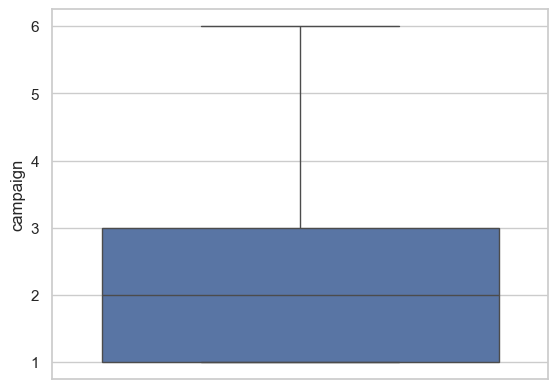

In [85]:
sns.boxplot(data['campaign'])

In [86]:
data['campaign'].value_counts()

campaign
1    17642
2    12976
3     5341
4     2651
5     1599
6      979
Name: count, dtype: int64

In [87]:
# removeimg outlier of Pdays
Q1=data['pdays'].quantile(0.25)
Q3=data['pdays'].quantile(0.75)
iqr=Q3-Q1
upper_limit=Q3+(1.5*iqr)
lower_limit=Q1-(1.5*iqr)

In [88]:
data.loc[data['pdays']>upper_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target


In [89]:
data.loc[data['pdays']<lower_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target
24108,37,admin.,married,university.degree,no,yes,no,telephone,nov,wed,119,1,6,1,success,-0.1,93.200,-42.0,4.286,5195.8,no
24264,48,management,married,university.degree,no,yes,no,cellular,nov,mon,112,1,4,1,success,-0.1,93.200,-42.0,4.191,5195.8,no
24279,42,technician,married,professional.course,no,yes,no,cellular,nov,mon,94,1,4,1,success,-0.1,93.200,-42.0,4.191,5195.8,no
24397,50,entrepreneur,married,university.degree,no,yes,no,cellular,nov,mon,77,1,3,1,success,-0.1,93.200,-42.0,4.191,5195.8,no
24482,36,self-employed,single,university.degree,no,yes,no,cellular,nov,mon,200,2,4,1,success,-0.1,93.200,-42.0,4.191,5195.8,no
24613,32,blue-collar,married,basic.9y,no,no,no,cellular,nov,mon,1091,2,5,1,success,-0.1,93.200,-42.0,4.191,5195.8,yes
24799,31,entrepreneur,divorced,basic.4y,no,no,no,cellular,nov,tue,290,1,5,1,success,-0.1,93.200,-42.0,4.153,5195.8,no
24850,51,admin.,married,university.degree,no,no,no,cellular,nov,tue,104,2,1,1,success,-0.1,93.200,-42.0,4.153,5195.8,no
24910,52,admin.,single,basic.9y,no,yes,no,cellular,nov,tue,296,1,6,1,success,-0.1,93.200,-42.0,4.153,5195.8,no
25053,31,blue-collar,single,basic.9y,no,yes,no,cellular,nov,tue,65,1,4,1,success,-0.1,93.200,-42.0,4.153,5195.8,no


In [90]:
len(data.loc[data['pdays']<lower_limit])/len(data)*100

3.6782558026609693

In [91]:
data.loc[data['pdays']<lower_limit,'pdays']=data['pdays'].median()

<Axes: ylabel='pdays'>

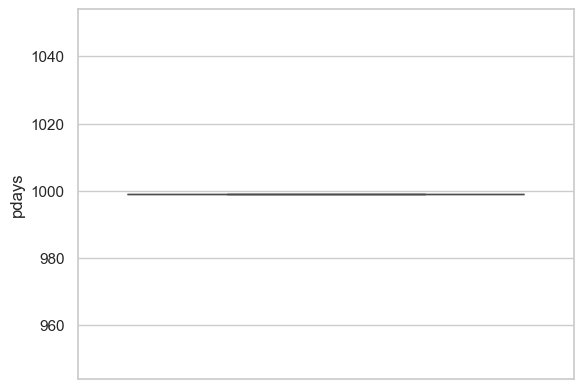

In [92]:
sns.boxplot(data['pdays'])

In [93]:
#removeing outliers of cons_conf_idx
Q1=data['cons_conf_idx'].quantile(0.25)
Q3=data['cons_conf_idx'].quantile(0.75)
iqr=Q3-Q1
upper_limit=Q3+(1.5*iqr)
lower_limit=Q1-(1.5*iqr)

In [94]:
data.loc[data['cons_conf_idx']>upper_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target
38154,50,management,married,university.degree,no,yes,no,cellular,oct,thu,305,2,999,1,success,-3.4,92.431,-26.9,0.754,5017.5,yes
38155,37,admin.,single,university.degree,no,yes,no,cellular,oct,thu,447,3,999,0,nonexistent,-3.4,92.431,-26.9,0.754,5017.5,yes
38156,59,technician,single,basic.6y,no,no,no,cellular,oct,thu,86,1,999,2,failure,-3.4,92.431,-26.9,0.754,5017.5,no
38157,31,admin.,married,university.degree,no,yes,no,cellular,oct,thu,760,1,999,0,nonexistent,-3.4,92.431,-26.9,0.754,5017.5,no
38158,35,admin.,married,high.school,no,yes,no,cellular,oct,thu,194,1,999,1,success,-3.4,92.431,-26.9,0.754,5017.5,yes
38159,35,admin.,married,high.school,no,no,no,cellular,oct,thu,302,1,999,2,success,-3.4,92.431,-26.9,0.754,5017.5,no
38160,36,admin.,married,university.degree,no,yes,no,cellular,oct,thu,66,1,999,0,nonexistent,-3.4,92.431,-26.9,0.754,5017.5,no
38161,69,retired,married,university.degree,no,yes,no,cellular,oct,thu,199,1,999,0,nonexistent,-3.4,92.431,-26.9,0.754,5017.5,no
38162,65,admin.,married,university.degree,no,yes,no,cellular,oct,thu,120,1,999,0,nonexistent,-3.4,92.431,-26.9,0.754,5017.5,no
38163,49,technician,divorced,university.degree,no,no,no,cellular,oct,thu,56,1,999,2,failure,-3.4,92.431,-26.9,0.754,5017.5,no


In [95]:
data.loc[data['cons_conf_idx']<lower_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target


In [96]:
len(data.loc[data['cons_conf_idx']>upper_limit])/len(data)*100

1.0852675536564047

In [97]:
data.loc[data['cons_conf_idx']>upper_limit,'cons_conf_idx']=data['cons_conf_idx'].median()

<Axes: ylabel='cons_conf_idx'>

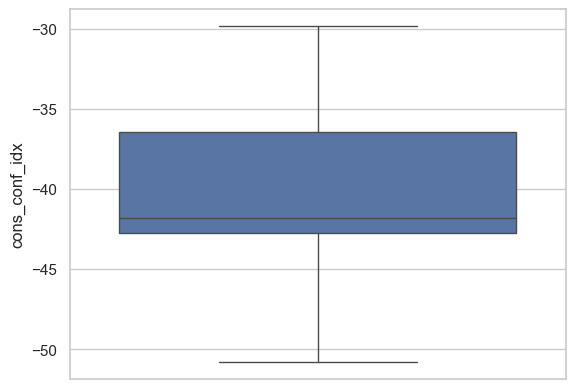

In [98]:
sns.boxplot(data['cons_conf_idx'])

In [99]:
#removeing outliers of previous
Q1=data['previous'].quantile(0.25)
Q3=data['previous'].quantile(0.75)
iqr=Q3-Q1
upper_limit=Q3+(1.5*iqr)
lower_limit=Q1-(1.5*iqr)

In [100]:
data.loc[data['previous']>upper_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target
24013,38,blue-collar,single,university.degree,no,yes,no,telephone,oct,tue,39,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,no
24019,40,services,married,high.school,no,yes,no,telephone,oct,tue,144,1,999,1,failure,-0.1,93.798,-40.4,4.968,5195.8,yes
24076,36,admin.,married,university.degree,no,yes,no,telephone,nov,wed,449,1,999,1,failure,-0.1,93.200,-42.0,4.663,5195.8,no
24102,36,admin.,married,high.school,no,yes,no,telephone,nov,wed,114,1,999,1,failure,-0.1,93.200,-42.0,4.286,5195.8,yes
24108,37,admin.,married,university.degree,no,yes,no,telephone,nov,wed,119,1,999,1,success,-0.1,93.200,-42.0,4.286,5195.8,no
24113,29,self-employed,married,university.degree,no,yes,no,telephone,nov,thu,86,1,999,1,failure,-0.1,93.200,-42.0,4.245,5195.8,no
24124,42,technician,divorced,professional.course,no,no,no,cellular,nov,mon,200,1,999,1,failure,-0.1,93.200,-42.0,4.191,5195.8,no
24135,34,admin.,single,high.school,no,no,no,cellular,nov,mon,303,1,999,1,failure,-0.1,93.200,-42.0,4.191,5195.8,no
24139,44,management,married,university.degree,no,yes,no,cellular,nov,mon,130,1,999,1,failure,-0.1,93.200,-42.0,4.191,5195.8,no
24140,51,technician,married,university.degree,no,no,no,cellular,nov,mon,324,1,999,1,failure,-0.1,93.200,-42.0,4.191,5195.8,no


In [101]:
data.loc[data['previous']<lower_limit]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,target


In [102]:
len(data.loc[data['previous']>upper_limit])/len(data)*100

13.65689035641449

* **In the previous column, there is a 13% presence of outliers. Since removing them could result in the loss of important data, we have chosen to retain them.* ** 


## ENCODING 

In [103]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, OrdinalEncoder

In [104]:
label = LabelEncoder()
data['marital'] = label.fit_transform(data['marital'])
data['default'] = label.fit_transform(data['default'])
data['housing'] = label.fit_transform(data['housing'])
data['loan'] = label.fit_transform(data['loan'])
data['contact'] = label.fit_transform(data['contact'])

In [105]:
#lets do onhotencoding
data=pd.get_dummies(data,columns=['month','poutcome','job','day_of_week'])

In [106]:
from sklearn.preprocessing import OrdinalEncoder

# Create an OrdinalEncoder with the desired categories including all unique values from 'education'
oe = OrdinalEncoder(categories=[['illiterate', 'basic.4y', 'basic.6y', 'basic.9y', 'high.school', 'professional.course', 'university.degree']]) # Added 'basic.9y' and 'illiterate' to the categories

# Fit and transform the 'education' column directly
data['education'] = oe.fit_transform(data[['education']]) # Pass the column as a DataFrame

## MAPPING

In [107]:
data = pd.get_dummies(data, drop_first=True)

In [108]:
data.columns

Index(['age', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'duration', 'campaign', 'pdays', 'previous', 'emp_var_rate',
       'cons_price_idx', 'cons_conf_idx', 'euribor3m', 'no_employed',
       'month_apr', 'month_aug', 'month_dec', 'month_jul', 'month_jun',
       'month_mar', 'month_may', 'month_nov', 'month_oct', 'month_sep',
       'poutcome_failure', 'poutcome_nonexistent', 'poutcome_success',
       'job_admin.', 'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'day_of_week_fri',
       'day_of_week_mon', 'day_of_week_thu', 'day_of_week_tue',
       'day_of_week_wed', 'target_yes'],
      dtype='object')

In [109]:
data['target_yes'].replace({'yes':1,'no':0},inplace=True)

In [110]:
data.head()

,age,marital,education,default,housing,loan,contact,duration,campaign,pdays,previous,emp_var_rate,cons_price_idx,cons_conf_idx,euribor3m,no_employed,month_apr,month_aug,month_dec,month_jul,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_nonexistent,poutcome_success,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,target_yes
0,56,1,1.0,0,0,0,1,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False
1,57,1,4.0,0,0,0,1,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False
2,37,1,4.0,0,1,0,1,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False
3,40,1,2.0,0,0,0,1,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,False,False,False,False,False,False,True,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
4,56,1,4.0,0,0,1,1,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False


## FEATURE ENGINEERING

In [111]:
 #pd.DataFrame(data= RandomForestClassifier().fit(x,y).feature_importances_,index=x.columns
              #,columns=['Feature Importance']).plot.barh();

In [112]:
import numpy as np

corr_matrix = data.corr()
high_corr_pairs = np.where((corr_matrix > 0.90) & (corr_matrix < 1))
high_corr_columns = [(data.columns[i], data.columns[j]) for i, j in zip(*high_corr_pairs)]
print(high_corr_columns)

[('emp_var_rate', 'euribor3m'), ('emp_var_rate', 'no_employed'), ('euribor3m', 'emp_var_rate'), ('euribor3m', 'no_employed'), ('no_employed', 'emp_var_rate'), ('no_employed', 'euribor3m')]


* ***To enhance model performance and mitigate multicollinearity, we are strategically removing highly correlated features. This ensures a more robust and reliable predictive model.*** 

In [113]:
data.drop(columns=['emp_var_rate','no_employed'], inplace=True)

In [114]:
data.drop(columns=['duration'],inplace=True)

In [115]:
data.columns

Index(['age', 'marital', 'education', 'default', 'housing', 'loan', 'contact',
       'campaign', 'pdays', 'previous', 'cons_price_idx', 'cons_conf_idx',
       'euribor3m', 'month_apr', 'month_aug', 'month_dec', 'month_jul',
       'month_jun', 'month_mar', 'month_may', 'month_nov', 'month_oct',
       'month_sep', 'poutcome_failure', 'poutcome_nonexistent',
       'poutcome_success', 'job_admin.', 'job_blue-collar', 'job_entrepreneur',
       'job_housemaid', 'job_management', 'job_retired', 'job_self-employed',
       'job_services', 'job_student', 'job_technician', 'job_unemployed',
       'day_of_week_fri', 'day_of_week_mon', 'day_of_week_thu',
       'day_of_week_tue', 'day_of_week_wed', 'target_yes'],
      dtype='object')

In [116]:
data['target_yes'].value_counts()

target_yes
False    36548
True      4640
Name: count, dtype: int64

In [117]:
x=data.drop(columns=['target_yes'])
y=data['target_yes']

In [118]:
y.value_counts().sum()

41188

# Task 2:-Create a predictive model which will help the bank marketing team to know which customer will buy the product.

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import GradientBoostingClassifier

## SPLITING THE DATA INTO TRAIN AND TEST

In [120]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [121]:
x_train.shape

(32950, 42)

## SCALING

In [122]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

In [123]:
x_train

array([[ 0.04403274, -0.28029281, -0.75280876, ..., -0.51333921,
        -0.49634592, -0.49587095],
       [-0.88980892, -0.28029281,  1.06903784, ..., -0.51333921,
        -0.49634592, -0.49587095],
       [ 2.01547624, -0.28029281, -1.96737316, ..., -0.51333921,
        -0.49634592, -0.49587095],
       ...,
       [-0.47476819, -0.28029281, -0.14552656, ...,  1.94802966,
        -0.49634592, -0.49587095],
       [ 0.04403274, -0.28029281,  1.06903784, ..., -0.51333921,
        -0.49634592,  2.01665371],
       [-1.09732929,  1.36893008,  1.06903784, ..., -0.51333921,
        -0.49634592, -0.49587095]])

In [124]:
x_test

array([[ 1.80795587, -0.28029281, -0.14552656, ..., -0.51333921,
        -0.49634592, -0.49587095],
       [ 1.6004355 , -0.28029281,  1.06903784, ...,  1.94802966,
        -0.49634592, -0.49587095],
       [-0.68228855, -0.28029281, -0.75280876, ..., -0.51333921,
        -0.49634592, -0.49587095],
       ...,
       [ 0.66659384,  1.36893008,  1.06903784, ..., -0.51333921,
        -0.49634592, -0.49587095],
       [-0.88980892,  1.36893008,  1.06903784, ..., -0.51333921,
        -0.49634592,  2.01665371],
       [ 2.01547624, -0.28029281,  1.06903784, ..., -0.51333921,
        -0.49634592, -0.49587095]])

In [125]:
x_train=pd.DataFrame(x_train,columns=x.columns)
x_test=pd.DataFrame(x_test,columns=x.columns)

In [126]:
y_train

12556    False
35451    False
30592    False
17914    False
3315     False
29191    False
30549    False
6098     False
6252     False
13373    False
24889    False
26323    False
8191     False
3725     False
18087    False
36388    False
39170     True
25503    False
13310    False
30196    False
919      False
33698    False
36871    False
11438    False
28914    False
32845    False
31679    False
6010     False
32385    False
33729    False
25082    False
34576    False
27325    False
39411     True
14695     True
16723    False
29438    False
27089    False
31119    False
1311     False
9420     False
3584     False
38935     True
12555    False
24910    False
38872    False
21896    False
3489     False
8019     False
40639     True
37741    False
25222    False
26188    False
22395    False
4952     False
38270     True
33055    False
24542    False
21906    False
32483     True
21403    False
3250     False
31908    False
9619     False
9632     False
9410     False
33274    F

* **Since the target column is imbalanced, we will implement balancing techniques to ensure fair representation and improve model accuracy. This will help create a more reliable and effective predictive model.** 


In [127]:
from sklearn.utils.class_weight import compute_sample_weight

sample_weights = compute_sample_weight(class_weight={0:1,1:3}, y=y_train)

# we can also apply other methods like smote ,undersampling,oversampling ,
#but we are use this to get better accuracy

## 1. Logistic Regression

In [128]:
from sklearn.linear_model import LogisticRegression
lg=LogisticRegression()
lg.fit(x_train,y_train,sample_weight=sample_weights)
y_pred=lg.predict(x_test)

 logistic regression Accuracy: 0.8753338188880796

 Classification Report for Logistic Regression:
              precision    recall  f1-score   support

       False       0.93      0.93      0.93      7303
        True       0.45      0.45      0.45       935

    accuracy                           0.88      8238
   macro avg       0.69      0.69      0.69      8238
weighted avg       0.88      0.88      0.88      8238



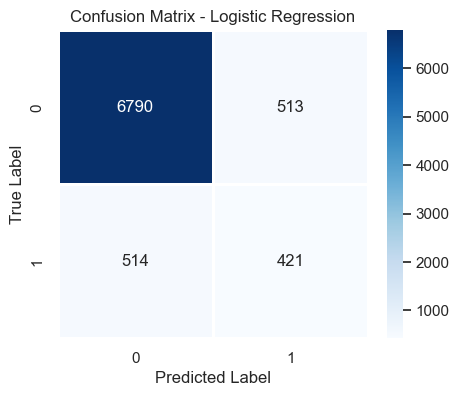

In [129]:
lg_acc = accuracy_score(y_test, y_pred)
print(" logistic regression Accuracy:", lg_acc)
print("\n Classification Report for Logistic Regression:")
print(classification_report(y_test,y_pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Logistic Regression")
plt.show()

## 2. Support Vector Machine (SVM)

In [130]:
from itertools import product

params_gried_linear ={
    'C':[0.1,1,10,100],
    'kernel':['linear'],
    'gamma':['scale','auto']
}
params_gried_rbf ={
    'C':[0.1,1,10,100],
    'kernel':['rbf'],
    'gamma':['scale','auto'],
}
params_gried_poly ={
    'C':[0.,1,10,100],
    'kernel':['poly'],
    'gamma':['scale','auto'],
    'degree':[2,3,4]
}


In [131]:

from sklearn.svm import SVC
svc=SVC(C=0.1,gamma='scale',kernel='linear')
svc.fit(x_train,y_train,sample_weight=sample_weights)
pred=svc.predict(x_test)

🔹 support vector classifier Accuracy: 0.875455207574654

🔹 Classification Report for Support Vector Machine:
              precision    recall  f1-score   support

       False       0.93      0.93      0.93      7303
        True       0.45      0.46      0.46       935

    accuracy                           0.88      8238
   macro avg       0.69      0.69      0.69      8238
weighted avg       0.88      0.88      0.88      8238



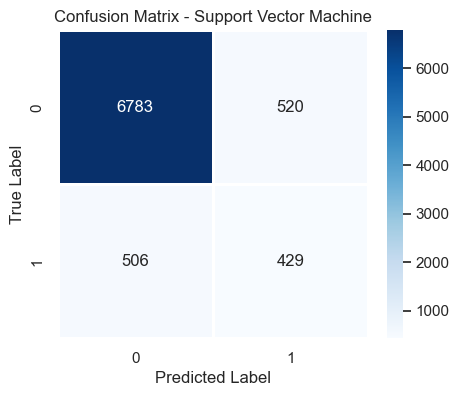

In [132]:
svc_acc = accuracy_score(y_test,pred)
print("🔹 support vector classifier Accuracy:", svc_acc)
print("\n🔹 Classification Report for Support Vector Machine:")
print(classification_report(y_test, pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test,pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Support Vector Machine")
plt.show()

In [133]:
#{'C': 0.1, 'gamma': 'scale', 'kernel': 'linear'}

## K-Neighbor Classifier

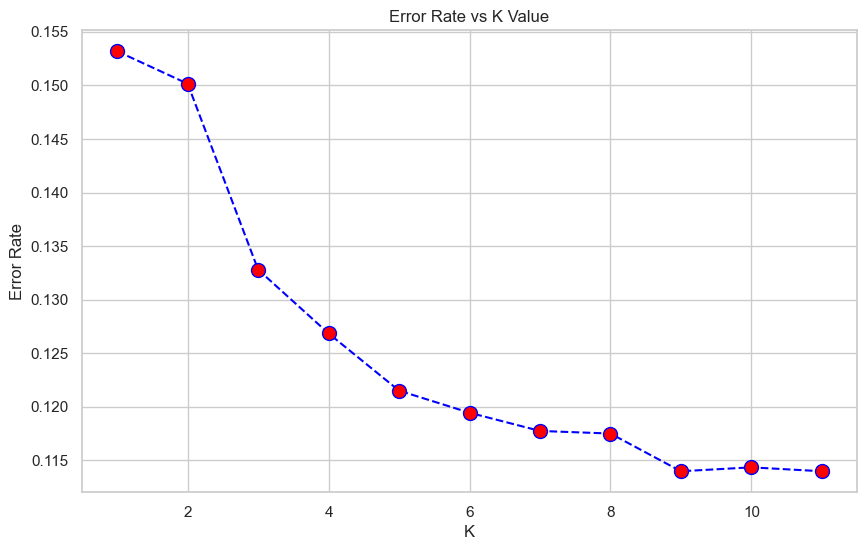

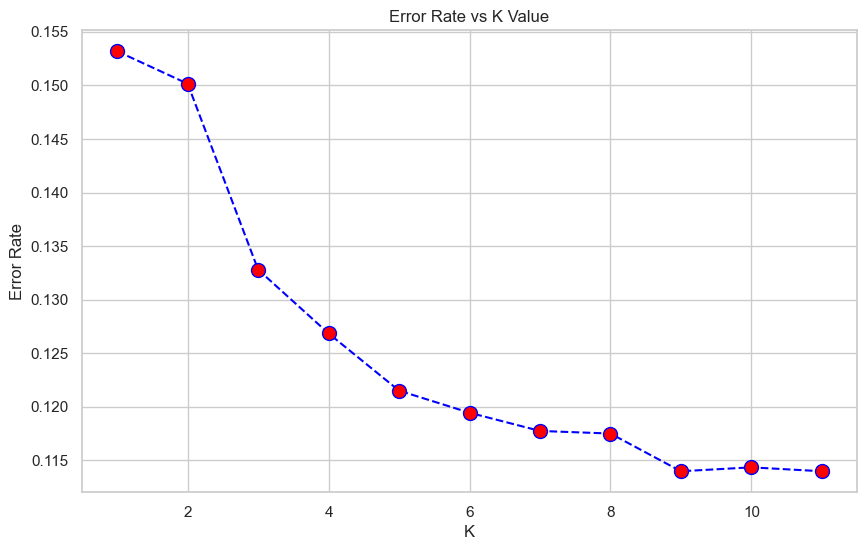

In [134]:
#using knn
from sklearn.neighbors import KNeighborsClassifier
error_rate=[]
for i in range(1,12):
  knn = KNeighborsClassifier(n_neighbors=i, weights='distance')
  knn.fit(x_train,y_train)
  pred_i=knn.predict(x_test)
  error_rate.append(np.mean(pred_i!=y_test))
plt.figure(figsize=(10,6))
plt.plot(range(1,12),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red',markersize=10)
plt.title('Error Rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()#using knn
from sklearn.neighbors import KNeighborsClassifier
error_rate=[]
for i in range(1,12):
  knn = KNeighborsClassifier(n_neighbors=i, weights='distance')
  knn.fit(x_train,y_train)
  pred_i=knn.predict(x_test)
  error_rate.append(np.mean(pred_i!=y_test))
plt.figure(figsize=(10,6))
plt.plot(range(1,12),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red',markersize=10)
plt.title('Error Rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [135]:
knn=KNeighborsClassifier(n_neighbors=9,weights='distance')
knn.fit(x_train,y_train)
pred_i=knn.predict(x_test)

🔹 knn Accuracy: 0.8860160233066279

🔹 Classification knn:
              precision    recall  f1-score   support

       False       0.91      0.97      0.94      7303
        True       0.50      0.26      0.34       935

    accuracy                           0.89      8238
   macro avg       0.70      0.61      0.64      8238
weighted avg       0.86      0.89      0.87      8238



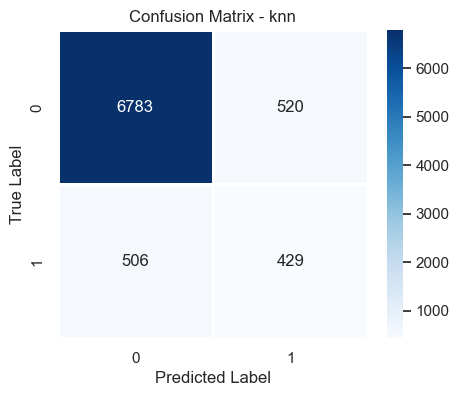

In [136]:
knn_acc = accuracy_score(y_test,pred_i)
print("🔹 knn Accuracy:", knn_acc)
print("\n🔹 Classification knn:")
print(classification_report(y_test, pred_i))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test,pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - knn")
plt.show()

## Decision Tree

In [137]:
#lets do hyperparameter tunning of all models
#decision tree parameter tunning
from sklearn.model_selection import GridSearchCV
params={
    'criterion':['gini','entropy'],
    'max_depth':[1,2,3,4,5,6,7,8,9,10],
    'min_samples_split':[2,3,4,5,6,7],
    'min_samples_leaf':[1,2,3,4,5,6,7,8,9,10]
}
tree_clf=DecisionTreeClassifier()
tree_cv=GridSearchCV(tree_clf,param_grid=params,scoring='f1',n_jobs=1,verbose=2,cv=5)
tree_cv.fit(x_train,y_train,sample_weight=sample_weights)
best_params=tree_cv.best_params_
print(best_params)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=2; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_leaf=1, min_samples_split=3; total time=   0.0s
[CV] END criterion=gini, max_depth=1, min_samples_lea

In [138]:
best_params

{'criterion': 'entropy',
 'max_depth': 5,
 'min_samples_leaf': 9,
 'min_samples_split': 2}

In [139]:
#use dt
dt=DecisionTreeClassifier(criterion='gini',max_depth=8,min_samples_leaf=10,min_samples_split=7)
dt.fit(x_train,y_train,sample_weight=sample_weights)
y_pred=dt.predict(x_test)

🔹 Decision Tree Accuracy: 0.8772760378732702

🔹 Classification Report for K-Neighbor Classifier:
              precision    recall  f1-score   support

       False       0.94      0.93      0.93      7303
        True       0.46      0.50      0.48       935

    accuracy                           0.88      8238
   macro avg       0.70      0.71      0.71      8238
weighted avg       0.88      0.88      0.88      8238



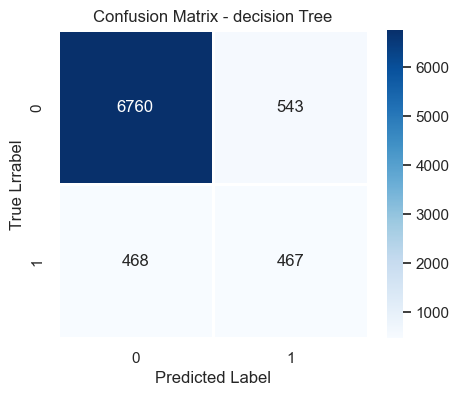

In [140]:
# Evaluate Decision Tree
dth_acc= accuracy_score(y_test,y_pred )
print("🔹 Decision Tree Accuracy:", dth_acc)
print("\n🔹 Classification Report for K-Neighbor Classifier:")
print(classification_report(y_test, y_pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Lrrabel")
plt.title("Confusion Matrix - decision Tree")
plt.show()

## Random Forest

In [141]:
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=200)
rfc.fit(x_train,y_train,sample_weight=sample_weights)
pred=rfc.predict(x_test)

🔹 Decision Tree Accuracy: 0.8902646273367322

🔹 Classification Report for Random Forest:
              precision    recall  f1-score   support

       False       0.91      0.97      0.94      7303
        True       0.53      0.29      0.37       935

    accuracy                           0.89      8238
   macro avg       0.72      0.63      0.66      8238
weighted avg       0.87      0.89      0.88      8238



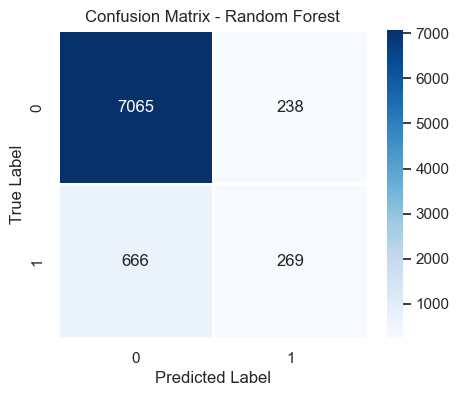

In [142]:
rfc_acc = accuracy_score(y_test, pred)
print("🔹 Decision Tree Accuracy:", rfc_acc)
print("\n🔹 Classification Report for Random Forest:")
print(classification_report(y_test, pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Random Forest")
plt.show()


## XG Boost 

In [143]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier

param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 300]
}

xgb = XGBClassifier(eval_metric='logloss')

grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(x_train, y_train)

print(grid_search.best_params_)


{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}


In [144]:
from xgboost import XGBClassifier
xgb_final = XGBClassifier(eval_metric='logloss',learning_rate=0.01,max_depth=5, n_estimators=200)
xgb_final.fit(x_train, y_train,sample_weight=sample_weights)
xgb_pred = xgb_final.predict(x_test)

🔹   XGBClassifier Accuracy: 0.8794610342316096

🔹 Classification Report for XG Boost:
              precision    recall  f1-score   support

       False       0.93      0.93      0.93      7303
        True       0.47      0.50      0.48       935

    accuracy                           0.88      8238
   macro avg       0.70      0.71      0.71      8238
weighted avg       0.88      0.88      0.88      8238



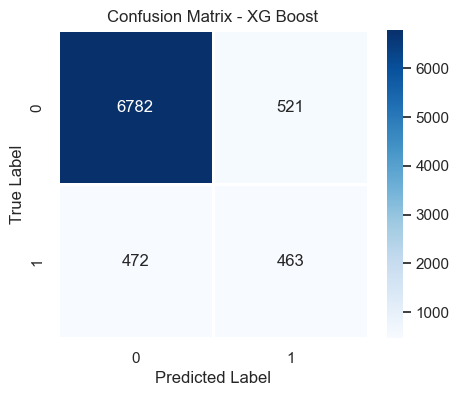

In [145]:
# Evaluate Decision Tree
xgb_acc = accuracy_score(y_test,xgb_pred)
print("🔹   XGBClassifier Accuracy:", xgb_acc)
print("\n🔹 Classification Report for XG Boost:")
print(classification_report(y_test, xgb_pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, xgb_pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - XG Boost")
plt.show()

## graient Boosting

In [146]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.5, 0.7, 1.0]
}

gbc = GradientBoostingClassifier()

grid_search = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(x_train, y_train, sample_weight=sample_weights)

print(grid_search.best_params_)

{'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 100, 'subsample': 0.5}


In [147]:

from sklearn.ensemble import GradientBoostingClassifier
gbc=GradientBoostingClassifier(learning_rate= 0.01, max_depth= 7,n_estimators=100,subsample=0.5)
gbc.fit(x_train,y_train,sample_weight=sample_weights)
gbc_pred=gbc.predict(x_test)


🔹 Decision Tree Accuracy: 0.891964068948774

🔹 Classification Report for Gradient Boost:
              precision    recall  f1-score   support

       False       0.92      0.96      0.94      7303
        True       0.54      0.36      0.43       935

    accuracy                           0.89      8238
   macro avg       0.73      0.66      0.69      8238
weighted avg       0.88      0.89      0.88      8238



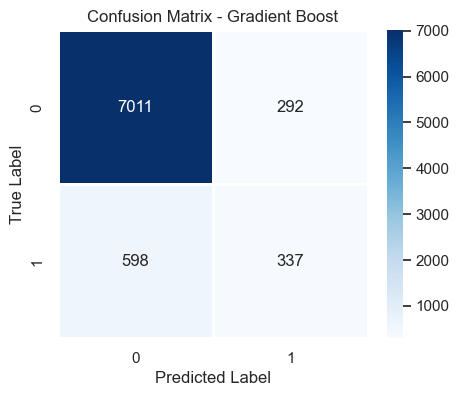

In [148]:
gbc_acc = accuracy_score(y_test,gbc_pred)
print("🔹 Decision Tree Accuracy:", gbc_acc)
print("\n🔹 Classification Report for Gradient Boost:")
print(classification_report(y_test, gbc_pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, gbc_pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Gradient Boost")
plt.show()

## Naive Bayes

In [149]:
from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()
nb.fit(x_train,y_train,sample_weight=sample_weights)
nb_pred=nb.predict(x_test)

🔹 Naive Bayes Accuracy: 0.891964068948774

🔹 Classification Report for Naive Bayes:
              precision    recall  f1-score   support

       False       0.95      0.48      0.64      7303
        True       0.17      0.81      0.27       935

    accuracy                           0.52      8238
   macro avg       0.56      0.64      0.46      8238
weighted avg       0.86      0.52      0.60      8238



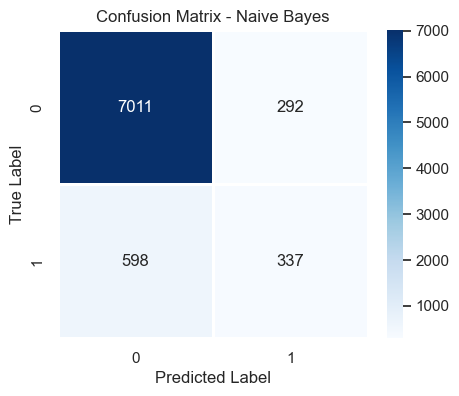

In [150]:
nb_acc = accuracy_score(y_test,gbc_pred)
print("🔹 Naive Bayes Accuracy:", nb_acc)
print("\n🔹 Classification Report for Naive Bayes:")
print(classification_report(y_test, nb_pred))

# Plot Confusion Matrix
plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, gbc_pred), annot=True, fmt='d', cmap='Blues', linewidths=1)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Naive Bayes")
plt.show()

## Accuracy Comparison

In [151]:
models=pd.DataFrame({
    "models":['Logistic regression',"k-nearest neighbors","Decision Tree Classifies",
              "Support Vector Machine","XG boost","Random forest","Gradient Boosting Classifier","Naive Bayes"],
    "accuracy":[lg_acc,knn_acc,dth_acc,svc_acc,xgb_acc,rfc_acc,gbc_acc,nb_acc]

})
models.sort_values(by='accuracy', ascending=False, ignore_index=True, inplace=True)


In [152]:
models

,models,accuracy
0,Gradient Boosting Classifier,0.891964
1,Naive Bayes,0.891964
2,Random forest,0.890265
3,k-nearest neighbors,0.886016
4,XG boost,0.879461
5,Decision Tree Classifies,0.877276
6,Support Vector Machine,0.875455
7,Logistic regression,0.875334



 Model Performance Comparison:
Gradient Boosting: 0.8920
Naive Bayes: 0.8920
Random Forest: 0.8903
KNN: 0.8860
XGBoost: 0.8795
Decision Tree: 0.8773
SVM: 0.8755
Logistic Regression: 0.8753


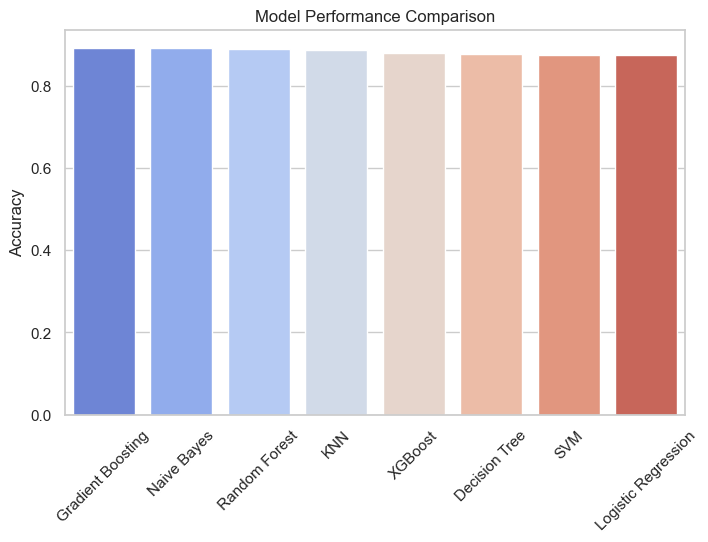

In [153]:
# Store model results
model_results = {
    "Logistic Regression": lg_acc,
    "Decision Tree": dth_acc,
    "Random Forest": rfc_acc,
    "Gradient Boosting": gbc_acc,
    "XGBoost": xgb_acc,
    "SVM": svc_acc,
    "KNN":knn_acc,
    "Naive Bayes":nb_acc
}

# Sort models by accuracy
sorted_results = sorted(model_results.items(), key=lambda x: x[1], reverse=True)
print("\n Model Performance Comparison:")
for model, acc in sorted_results:
    print(f"{model}: {acc:.4f}")

# Plot Model Comparison
plt.figure(figsize=(8, 5))
sns.barplot(x=[m[0] for m in sorted_results], y=[m[1] for m in sorted_results], palette="coolwarm")
plt.xticks(rotation=45)
plt.ylabel("Accuracy")
plt.title("Model Performance Comparison")
plt.show()

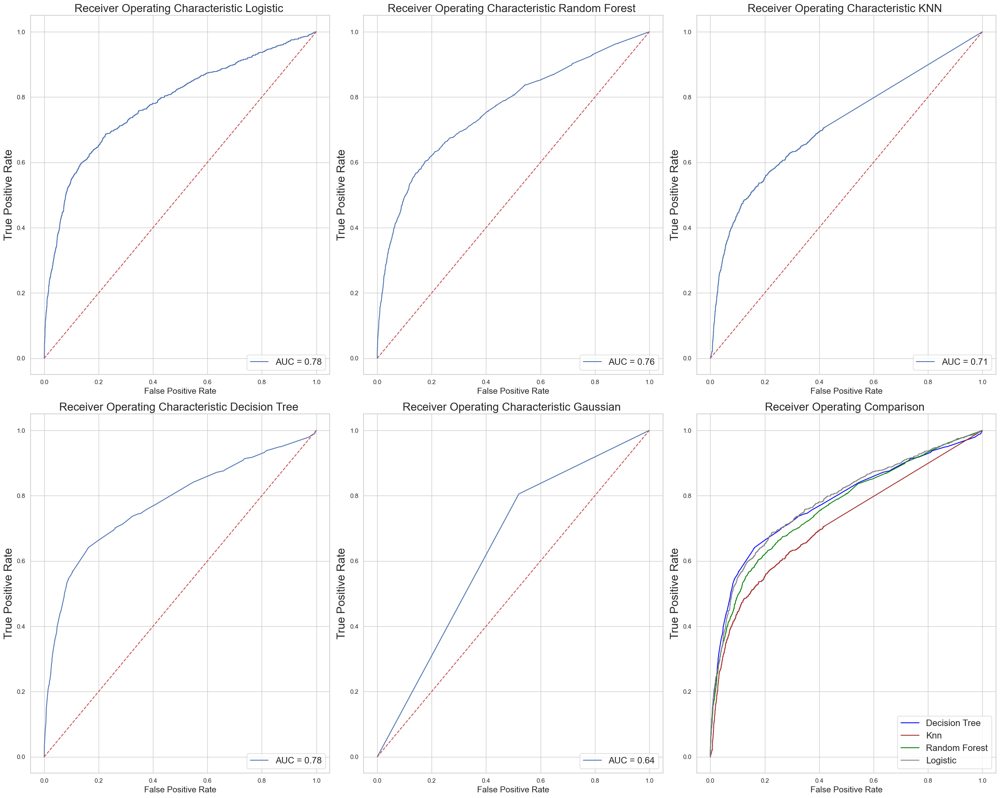

In [154]:
from sklearn import metrics
fig, ax_arr = plt.subplots(nrows = 2, ncols = 3, figsize = (25,20))

#-------------------- LOGMODEL --------------------
probs = lg.predict_proba(x_test)
preds = probs[:,1]
fprlog, tprlog, thresholdlog = metrics.roc_curve(y_test, preds)
roc_auclog = metrics.auc(fprlog, tprlog)

ax_arr[0,0].plot(fprlog, tprlog, 'b', label = 'AUC = %0.2f' % roc_auclog)
ax_arr[0,0].plot([0, 1], [0, 1],'r--')
ax_arr[0,0].set_title('Receiver Operating Characteristic Logistic ',fontsize=20)
ax_arr[0,0].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[0,0].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[0,0].legend(loc = 'lower right', prop={'size': 16})

#-------------------- RANDOM FOREST --------------------
probs = rfc.predict_proba(x_test)
preds = probs[:,1]
fprrfc, tprrfc, thresholdrfc = metrics.roc_curve(y_test, preds)
roc_aucrfc = metrics.auc(fprrfc, tprrfc)

ax_arr[0,1].plot(fprrfc, tprrfc, 'b', label = 'AUC = %0.2f' % roc_aucrfc)
ax_arr[0,1].plot([0, 1], [0, 1],'r--')
ax_arr[0,1].set_title('Receiver Operating Characteristic Random Forest ',fontsize=20)
ax_arr[0,1].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[0,1].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[0,1].legend(loc = 'lower right', prop={'size': 16})

#-------------------- KNN----------------------
probs = knn.predict_proba(x_test)
preds = probs[:,1]
fprknn, tprknn, thresholdknn = metrics.roc_curve(y_test, preds)
roc_aucknn = metrics.auc(fprknn, tprknn)

ax_arr[0,2].plot(fprknn, tprknn, 'b', label = 'AUC = %0.2f' % roc_aucknn)
ax_arr[0,2].plot([0, 1], [0, 1],'r--')
ax_arr[0,2].set_title('Receiver Operating Characteristic KNN ',fontsize=20)
ax_arr[0,2].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[0,2].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[0,2].legend(loc = 'lower right', prop={'size': 16})

#-------------------- DECISION TREE ---------------------
probs = dt.predict_proba(x_test)
preds = probs[:,1]
fprdtree, tprdtree, thresholddtree = metrics.roc_curve(y_test, preds)
roc_aucdtree = metrics.auc(fprdtree, tprdtree)

ax_arr[1,0].plot(fprdtree, tprdtree, 'b', label = 'AUC = %0.2f' % roc_aucdtree)
ax_arr[1,0].plot([0, 1], [0, 1],'r--')
ax_arr[1,0].set_title('Receiver Operating Characteristic Decision Tree ',fontsize=20)
ax_arr[1,0].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[1,0].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[1,0].legend(loc = 'lower right', prop={'size': 16})
#---------------------Naive Bayes--------------------
probs = nb.predict_proba(x_test)
preds = probs[:,1]
fprgau, tprgau, thresholdgau = metrics.roc_curve(y_test, nb_pred)
roc_aucgau = metrics.auc(fprgau, tprgau)

ax_arr[1,1].plot(fprgau, tprgau, 'b', label = 'AUC = %0.2f' % roc_aucgau)
ax_arr[1,1].plot([0, 1], [0, 1],'r--')
ax_arr[1,1].set_title('Receiver Operating Characteristic Gaussian ',fontsize=20)
ax_arr[1,1].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[1,1].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[1,1].legend(loc = 'lower right', prop={'size': 16})

#-------------------- ALL PLOTS ----------------------------------
ax_arr[1,2].plot(fprdtree, tprdtree, 'b', label = 'Decision Tree', color='blue')
ax_arr[1,2].plot(fprknn, tprknn, 'b', label = 'Knn', color='brown')
ax_arr[1,2].plot(fprrfc, tprrfc, 'b', label = 'Random Forest', color='green')
ax_arr[1,2].plot(fprlog, tprlog, 'b', label = 'Logistic', color='grey')
ax_arr[1,2].set_title('Receiver Operating Comparison ',fontsize=20)
ax_arr[1,2].set_ylabel('True Positive Rate',fontsize=20)
ax_arr[1,2].set_xlabel('False Positive Rate',fontsize=15)
ax_arr[1,2].legend(loc = 'lower right', prop={'size': 16})

plt.subplots_adjust(wspace=0.2)
plt.tight_layout()

**Logistic Regression** and **Decision Tree** appear to be the strongest candidates for production, both achieving an **AUC of 0.78**. Higher AUC values indicate better performance in distinguishing between classes, making these models reliable choices.

However, the best model for production depends on other factors beyond AUC, such as:
- **Interpretability:** Logistic Regression is more interpretable, while Decision Trees can become complex but provide decision rules.
- **Scalability:** Random Forest might be better suited for larger datasets compared to Decision Trees.
- **Computational Efficiency:** Logistic Regression is computationally inexpensive, making it suitable for real-time applications.
- **Robustness to Overfitting:** Random Forest typically generalizes better than Decision Trees.



# Task 3:-Suggestions to the Bank market team to make customers buy the product.

Here’s a refined explanation of the project that presents it clearly and professionally for the client:

---

## **Bank Marketing Optimization Strategy**

### **Objective**  
The goal of this marketing strategy is to enhance client engagement and improve subscription rates for banking services. By refining targeting, timing, and communication methods, the bank can significantly boost campaign effectiveness.

### **Key Strategies**  
✅ **Target the right audience** – Retirees, students, and previous subscribers show higher interest. Prioritizing these groups increases the likelihood of positive responses.  

✅ **Make conversations meaningful** – Longer, personalized discussions improve client trust and increase conversion rates.  

✅ **Time campaigns strategically** – Marketing efforts yield better results in **March, September, and October**, making these months ideal for outreach.  

✅ **Personalize communication** – Adapting the message based on **job, marital status, and past responses** ensures greater relevance and effectiveness.  

✅ **Reconnect with successful clients** – Individuals who have subscribed before are more likely to do so again. Strengthening relationships with past clients enhances retention.  

✅ **Balance outreach frequency** – Excessive calls can negatively impact engagement. Finding the right frequency prevents frustration and maintains interest.  

✅ **Address data gaps** – Missing details like **loan and housing status** hinder precise targeting. Collecting complete information ensures well-informed marketing decisions.  

✅ **Diversify engagement channels** – While phone calls remain effective, integrating emails and messages **expands reach** and **enhances overall campaign success**.  

### **Expected Outcome**  
By applying these strategies, the bank can improve conversion rates, optimize resource utilization, and enhance customer satisfaction. A focused and data-driven approach will maximize success in future marketing campaigns.

---



### **Final Recommendations for the Bank Marketing Strategy**  

To ensure an effective and customer-friendly marketing approach, the following recommendations will help improve campaign success while maintaining positive client relationships:  

✅ **Increase Sign-Ups Without Overwhelming Clients**  
A balanced outreach strategy ensures higher engagement without excessive calls that might discourage potential customers. Quality conversations over quantity lead to better results.  

✅ **Optimize Resources by Targeting the Right Clients**  
Focusing marketing efforts on individuals who are more likely to subscribe—such as retirees, students, and previous subscribers—will help save costs while maximizing conversion rates.  

✅ **Adapt Strategies Based on Customer Needs & Market Conditions**  
Understanding seasonal trends (March, September, and October) and tailoring outreach based on customer preferences ensures campaigns are well-timed and personalized for maximum impact.  

### **Expected Benefits**  
💡 **Higher Subscription Rates** – Improved targeting will increase the chances of success.  
💡 **Cost Efficiency** – Smarter resource allocation reduces unnecessary expenses.  
💡 **Enhanced Client Experience** – Personalized and well-timed interactions foster trust and customer satisfaction.  



### **Challenges Faced in the Project & Solutions**  

Here’s a refined version of your points for clearer communication:  

#### **1. Handling Missing and Unknown Data**  
**Issue:** Some columns had missing or unknown values, making data analysis difficult.  
**Solution:** Used **mode imputation** for missing values or removed irrelevant rows to ensure clean data.  

#### **2. Addressing Imbalanced Target Column**  
**Issue:** The majority class dominated the minority class, leading to biased predictions.  
**Solution:** Applied **class weight balancing techniques** to improve fairness in model predictions.  

#### **3. Feature Selection & Categorical Data Handling**  
**Issue:** Some features were irrelevant or highly correlated, affecting model accuracy.  
**Solution:** **Performed feature selection** to keep only relevant variables and **applied encoding techniques** to handle categorical data properly.  

#### **4. Building a High-Accuracy Predictive Model**  
**Issue:** The model suffered from **underfitting or overfitting**, reducing predictive performance.  
**Solution:** Implemented **Logistic Regression, Decision Tree, and Random Forest** with **hyperparameter tuning** to enhance accuracy.  

#### **5. Understanding Customer Behavior for Better Insights**  
**Issue:** Difficulty in identifying patterns in customer behavior.  
**Solution:** **Analyzed key factors** such as **age, job type, and education** to better target the right audience and improve marketing strategies.  

#### **6. Improving Model Performance**  
**Issue:** The model had **low recall and a high number of false negatives**, affecting decision-making.  
**Solution:** Used **Cross-Validation and Grid Search** to fine-tune the model for optimal performance.  

---  

